# **Project Name:- Netflix Movies and TV Shows Clustering**



*   Project type:- Unsupervised
*   Contribution:- Individual




# **PROJECT SUMMARY**

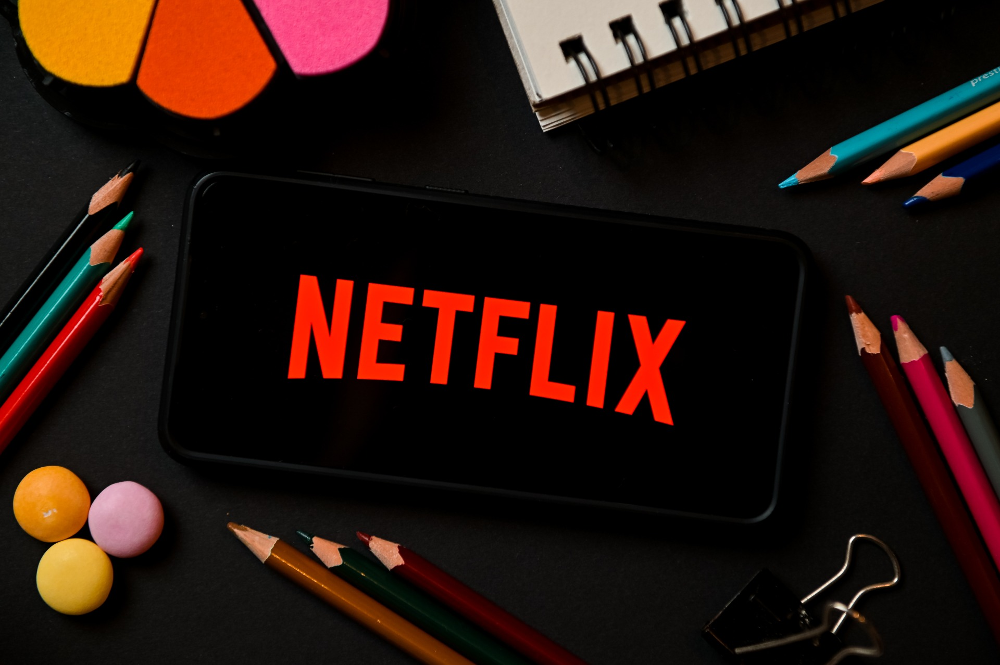


Summary:-

People justify spending time in the evening in front of a television or computer for many reasons. Everyday households with a Netflix account can sit down in front of a television, start watching a series, tv shows, movies and escape from reality. Watching Netflix is really a positive way to relieve stress or if it is actually taking up most of their free time.

Netflix has become something that affects many lives in many areas. So, in this project we will be anaysing and explore the dataset of netflix and try to predict variour trends, genres, country with maximum releases, population of netflix across year, etc.


**GitHub Link -** - https://github.com/shailendra1920?tab=repositories**

# **Problem Statement:-**
The dataset consist of tv shows and movies available on netflix as of 2019. The dataset is collected from a third-party Flixable. In 2018 Netflix released a report showing the number of movies have decreased more than 2000 titles since 2010, while on the same scale we can see that the number of tv shows have increased.

**Lets Begin:-**

### Importing the essential libraries.

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

from time import time

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import missingno as msno
%matplotlib inline

from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


In [ ]:
# for nlp
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk.stem.snowball import SnowballStemmer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch

In [ ]:
# pip install missingno

### Loading the data.

In [ ]:
df= pd.read_csv('NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv', parse_dates= ['date_added', 'duration'])
df= df.copy()

### Dataset First View

In [ ]:
# understaing the data

In [ ]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
#shape of the dataset
shape=df.shape
print("Rows :"+str(shape[0]) +", Columns :"+str(shape[1]))

Rows :7787, Columns :12


### Dataset Information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      5398 non-null   object        
 4   cast          7069 non-null   object        
 5   country       7280 non-null   object        
 6   date_added    7777 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7780 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(10)
memory usage: 730.2+ KB


In [ ]:
df.describe(include='all')

<ipython-input-9-174ba9bf1a5c>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.describe(include='all')


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1512,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,2020-01-01 00:00:00,NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,119,NaN,2863,1608,334,3
first,NaN,NaN,NaN,NaN,NaN,NaN,2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,2021-01-16 00:00:00,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN


#### Duplicate Values

In [ ]:
len(df[df.duplicated()])

0

In [ ]:
df.duplicated().sum()

0

*   There is no duplicates in the data

#### Missing Values/Null Values

In [ ]:
df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

 *    So we are having 2389 null values in director, 718 nulls in cast, 507 null in country, 10 in date_added and 7 null values in rating.





##### Visualizing the missing values

<Axes: >

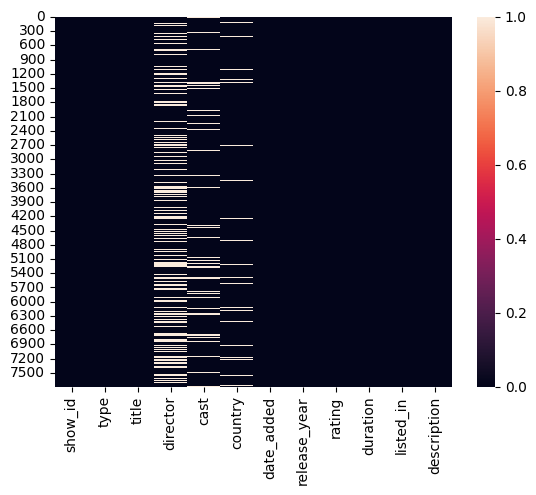

In [ ]:
sns.heatmap(df.isnull())

<Axes: >

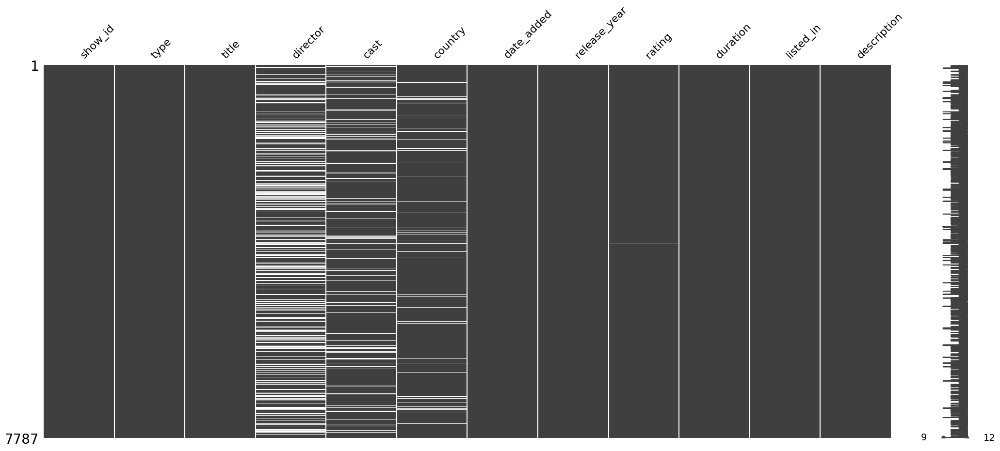

In [ ]:
msno.matrix(df)

<Axes: >

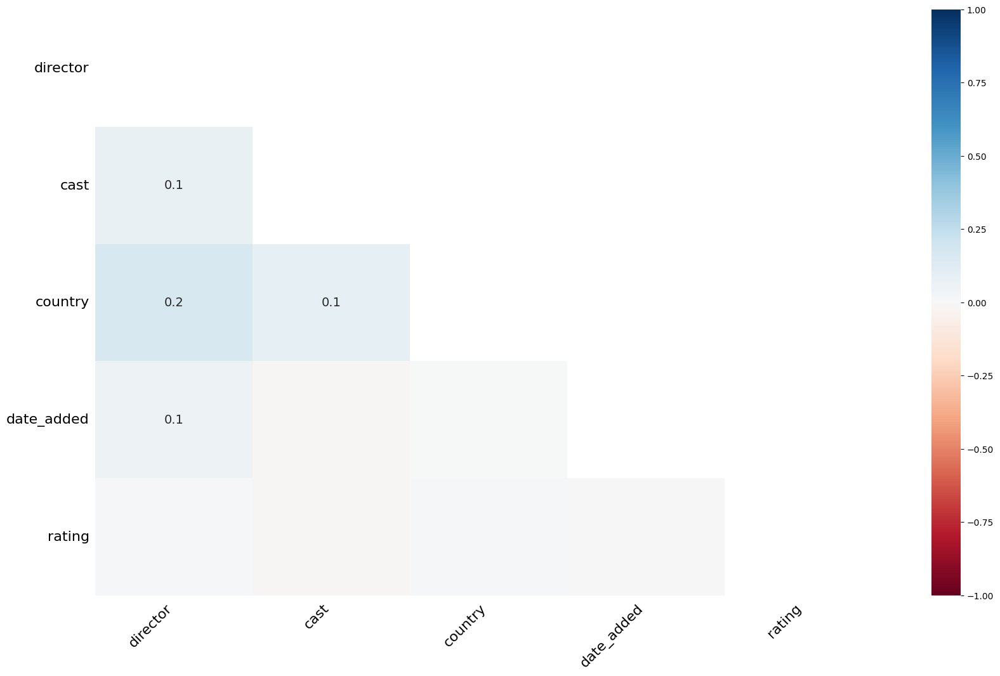

In [ ]:
msno.heatmap(df)

*   We found that direct, cast,country are having missing values whereas date_added and
*   Rating are having less missing values

##### Check count of unique id's in the dataset

In [ ]:
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1512
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

### Dataset Information

##### Understanding the variables

In [ ]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000




*   Variable description:- in variable description we have to describe the columns like
*   Release_year: date of release of the movie or tv show
*  Director : director of the movie

### WE FOUND THAT:-
 We found that our dataset contains

1.   We found that our dataset contains
2.   Our dataset contains 7787 rows and 12 columns
3.   There is no duplicates in our data
4.   There are null values present in the column director, cast, country, date_added, rating
5.   All the columns has almost unique values

### DATA WRANGLING

## **. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables**

#### **Univariate analysis**

##### Column no 1

In [ ]:
df['type'].value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

<Axes: xlabel='type', ylabel='count'>

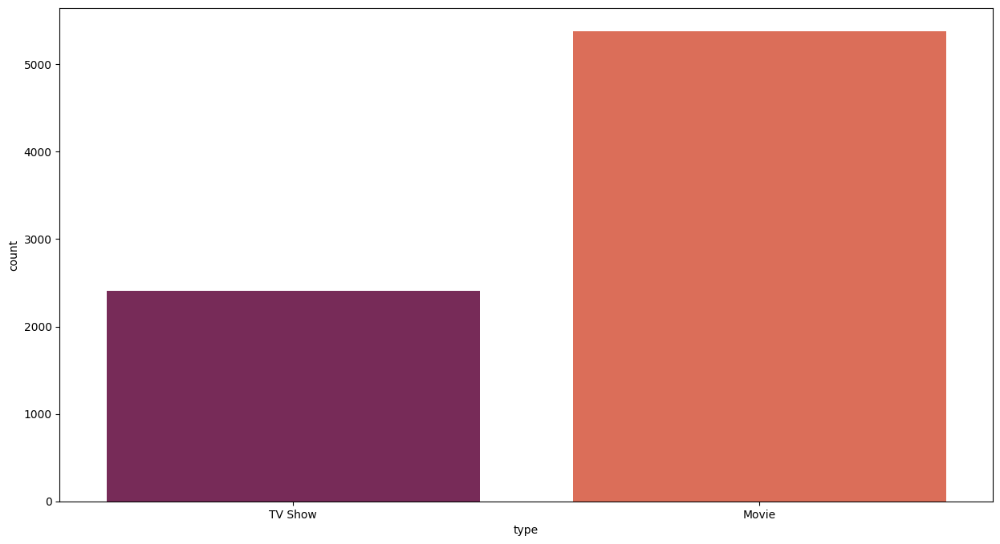

In [ ]:
plt.figure(figsize= (15,8))
sns.countplot(x= 'type', data= df, color= 'b', palette= 'rocket')

*  **So here we found that netfix contains more movies than tv_shows it has 5377 movies and 2410 tv_shows**

 Better visualization with pie chart

Text(0.5, 1.0, 'Distribution of type')

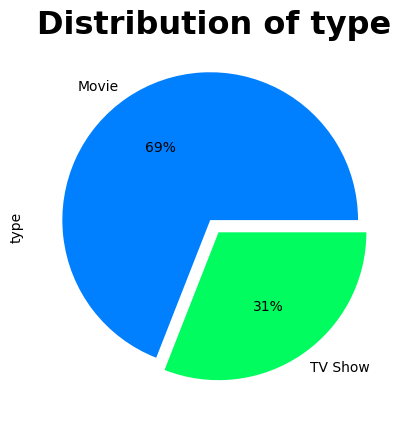

In [ ]:
sns.set_palette('gist_ncar')
df['type'].value_counts().plot(kind='pie', autopct= '%1.0f%%', explode= (0.05,0.05))
plt.title('Distribution of type', fontsize= 23, fontweight= 'bold')



*  **Here we found that netflix contains 69% movies and 31% tv_shows**

In [ ]:
df.head(2)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...


##### Column no. 2 title
 We will not go for value_counts cause it has almost every values as unique

In [ ]:
df['title'].nunique()

7787

In [ ]:
# word cloud import
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

<function matplotlib.pyplot.show(close=None, block=None)>

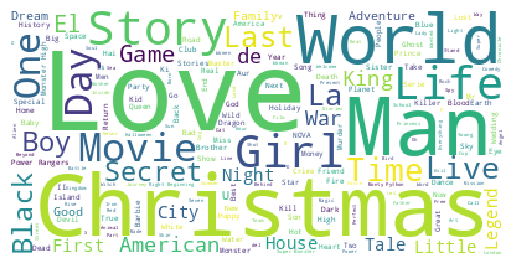

In [ ]:
# subsetting the dataset
df_wc= df['title']
text= " ".join(i for i in df_wc)
# create stopword list
stopwords= set(STOPWORDS)
# generating a word cloud_image
wordcloud= WordCloud(stopwords=stopwords, background_color='white').generate(text)
# display the generated image
plt.imshow(wordcloud, interpolation= 'nearest')
plt.axis('off')
plt.show


*  We see that world, love, man,story,life, girl are the most common titles we can feel like christmas as major attain

##### **Column no 3. Director**

In [ ]:
df['director'].value_counts()

Raúl Campos, Jan Suter    18
Marcus Raboy              16
Jay Karas                 14
Cathy Garcia-Molina       13
Youssef Chahine           12
                          ..
Vibhu Virender Puri        1
Lucien Jean-Baptiste       1
Jason Krawczyk             1
Quinn Lasher               1
Sam Dunn                   1
Name: director, Length: 4049, dtype: int64

*   As director column is haivng missing values so we will be checking that which is having more missing

<Axes: xlabel='type', ylabel='count'>

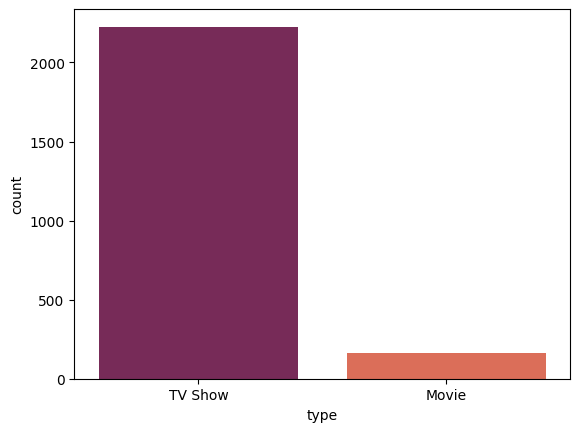

In [ ]:
missing_director= df[df['director'].isna()]
# sns.countplot(missing_director['type'])
sns.countplot(x= 'type', data= missing_director, color= 'b', palette= 'rocket')

 *  We see that tv_shows are having more missing data then movies in director column

Text(0.5, 1.0, 'the list of top 10 directors of netflix are')

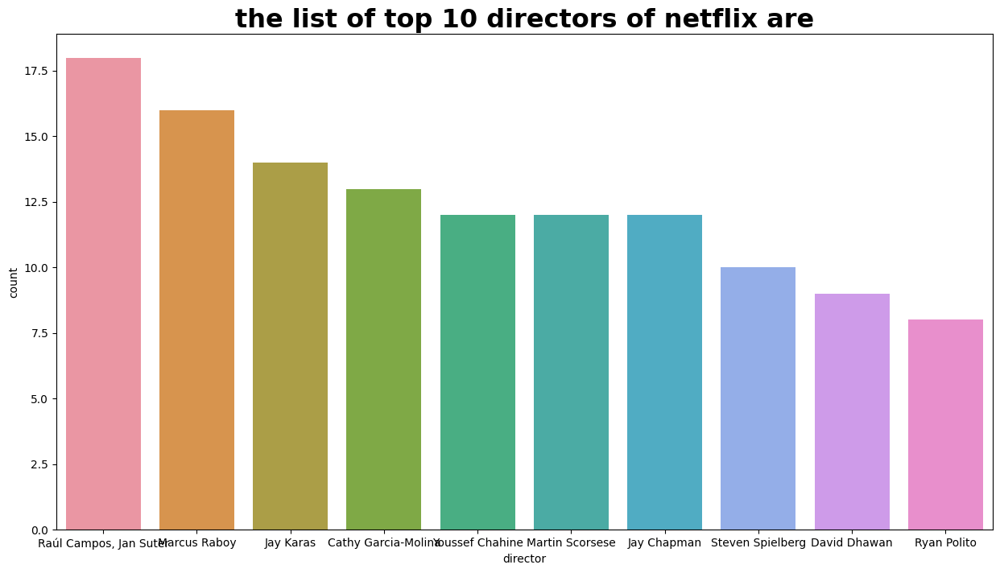

In [ ]:
# checking the top 10 directors
plt.figure(figsize= (15,8))
graph= sns.countplot(x= 'director', data= df, order= df['director'].value_counts().head(10).index)
graph.set_title('the list of top 10 directors of netflix are', fontsize= 23, fontweight= 'bold')

 *  We found that director (Raul Campos and Jan Sute have directed 18 movies, Marcus Raboy has directed 16 movies, Jay karas has 14 movies, Cathy Garcia has 13 movies and Bussef martin and Jay has directed 12 movies and so on.)

In [ ]:
# filling up the nan values
df.director.fillna(" ", inplace=True)

In [ ]:
# column no 4
df['cast'].nunique()
# so here i have lots of unique datas so

6831

In [ ]:
# filling up the nan values
df['cast'].fillna(" ", inplace= True)

In [ ]:
df.cast

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                                     
Name: cast, Length: 7787, dtype: object

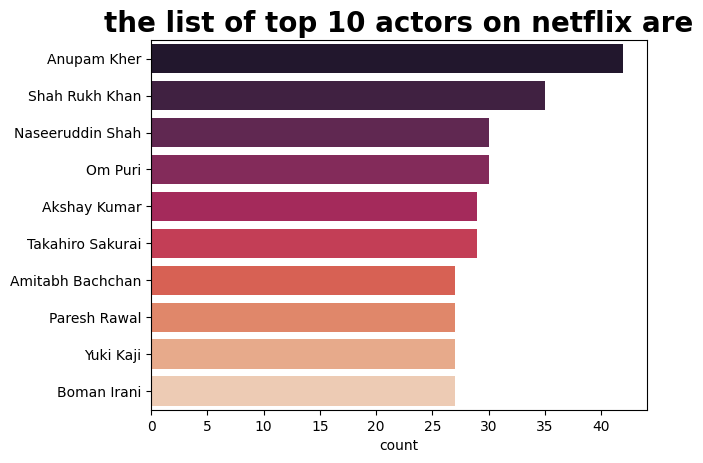

In [ ]:
# getting the top 10 actors on netflix
actor= df[df.cast != " "].set_index('title').cast.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
# actor= df[df.cast != " "].set_index('title').cast.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)

# getting the count plot
sns.countplot(y=actor, order= actor.value_counts().index[:10], palette= 'rocket')
plt.title('the list of top 10 actors on netflix are', fontsize=20, fontweight= 'bold')
plt.show()

*  We found that Anupam Kher is the top actor on netflix followed by Shah Rukh Khan
*  Anupam kher has done more than 40 movies and shah rukh khan has done 35 movies on netflix
* Nasiruddin shah and om puri has done in 30 movies on netflix
* Akshay kumar and takahiro sakurai has done 29 movies followed by amitabh bachchan, paresh rawal,
* Yuki kaji and boman irani has done 27 movies on netflix**

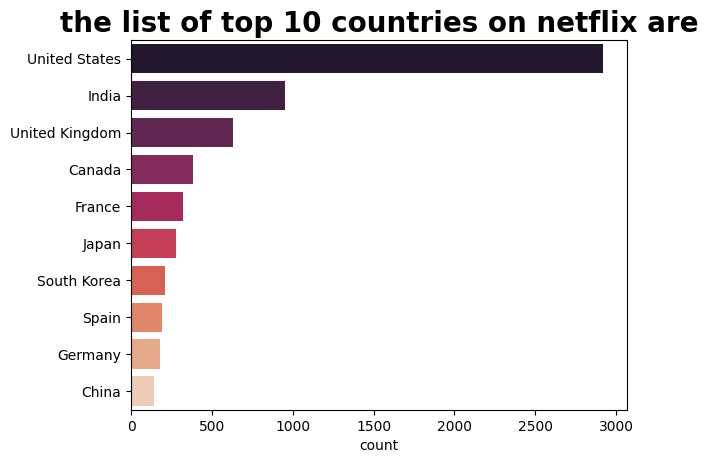

In [ ]:
# getting the top 10 countries on netflix
coun= df[df.cast != " "].set_index('title').country.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
# actor= df[df.cast != " "].set_index('title').cast.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)

# getting the count plot
sns.countplot(y=coun, order= coun.value_counts().index[:10], palette= 'rocket')
plt.title('the list of top 10 countries on netflix are', fontsize=20, fontweight= 'bold')
plt.show()

*  We found that United states is the top country on netflix
*   The second top country that we found is india which is followed by United Kingdom

In [ ]:
# column date_added
#  here from this column we will get the year and the month in which the show or movies are added on netflix
#  for this we will extract these
df['year_added']= df['date_added'].dt.year
df['month_added']= df['date_added'].dt.month

In [ ]:
# now we found the year and the month so we will count the no. of shows and movies added according to the year
df['year_added'].value_counts().reset_index().rename(columns={ 'index': 'year', 'year_added': 'movie_count'})

,year,movie_count
0,2019.0,2153
1,2020.0,2009
2,2018.0,1685
3,2017.0,1225
4,2016.0,443
5,2021.0,117
6,2015.0,88
7,2014.0,25
8,2011.0,13
9,2013.0,11


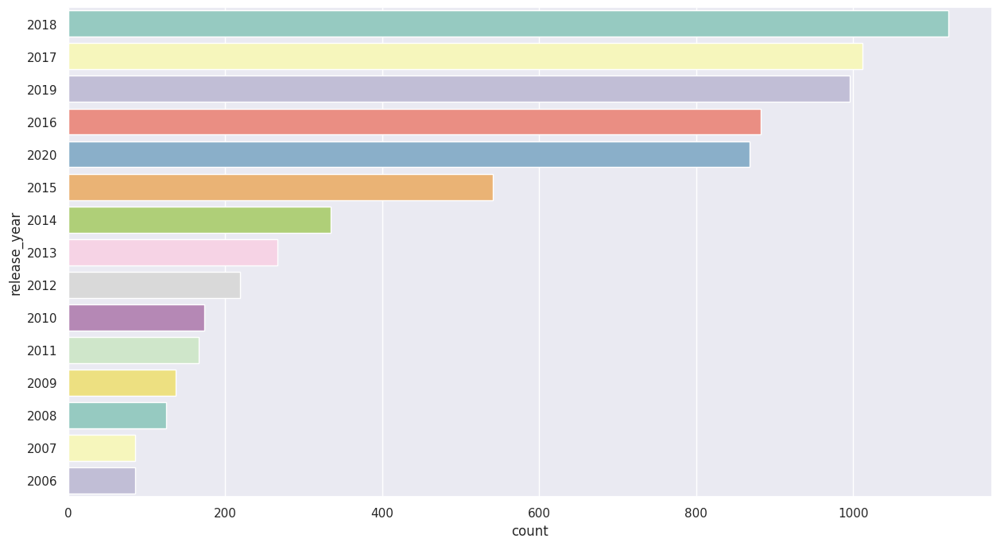

In [ ]:
# visualizing the above result
plt.figure(figsize= (15,8))
sns.set(style='darkgrid')
ax= sns.countplot(y='release_year',data= df, palette= 'Set3', order= df['release_year'].value_counts().index[0:15])

*  2018 has the maximum no_of_release
*  2017 is the second largest release_year followed by 2019,2016,2020
* The growth of movie release_yearly indicates public interest toward netflix movies and tv_shows

In [ ]:
# next column release _year
# here we will be checking the total content released per year
yearly_movies= df[df.type=='Movie']['release_year'].value_counts().sort_index(ascending= False).head(10)
yearly_shows= df[df['type']=='TV Show']['release_year'].value_counts().sort_index(ascending= False).head(10)
total_content= df['release_year'].value_counts().sort_index(ascending=False).head(10)

Text(0, 0.5, 'Releases')

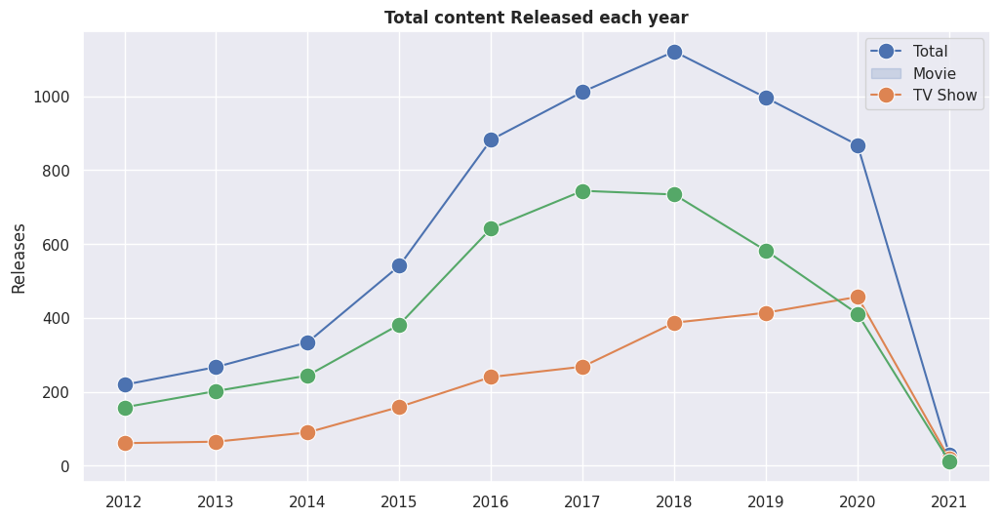

In [ ]:
fig,ax= plt.subplots(figsize=(12,6))
sns.lineplot(data= total_content, marker= 'o',
            markersize= 12)
sns.lineplot(data= yearly_shows, marker= 'o',
            markersize= 12)
sns.lineplot(data= yearly_movies, marker= 'o',
            markersize= 12)

# setting the range
ax.set_xticks(np.arange(2012,2022,1))
plt.title('Total content Released each year', fontsize=12, fontweight= 'bold')
plt.legend(['Total', 'Movie','TV Show'])
plt.ylabel('Releases')

*  Here we prove that the netflix report regarding no_of_tv_shows are the triple is correct we can see that the number of tv_shoes have tripple after 2015
Tv_shows has decrease after 2018 maybe because people started liking more of a netflix movies


In [ ]:
# rating columns
df['rating'].unique()

array(['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y', nan,
       'TV-Y7', 'PG', 'G', 'NC-17', 'TV-Y7-FV', 'UR'], dtype=object)

In [ ]:
# rating_replacements = {
#     67: 'TV-PG',
#     2359: 'TV-14',
#     3660: 'TV-MA',
#     3736: 'TV-MA',
#     3737: 'NR',
#     3738: 'TV-MA',
#     4323: 'TV-MA '
# }

# for id, rate in rating_replacements.items():
#     df.iloc[id, 8] = rate

In [ ]:
 ratings_ages = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

df['rating'] = df['rating'].replace(ratings_ages)
df['rating'].unique()

array(['Adults', 'Teens', 'Older Kids', 'Kids', nan], dtype=object)

In [ ]:
df['rating']

0           Adults
1           Adults
2           Adults
3            Teens
4            Teens
           ...    
7782        Adults
7783         Teens
7784        Adults
7785    Older Kids
7786        Adults
Name: rating, Length: 7787, dtype: object

In [ ]:
# creat a better chart with pie chart using plotly
import plotly.express as px
# pie chart code
graph= px.pie(df, names= 'rating', height= 500,width= 900,hole= 0.7, title= "netflix rating distribution")
graph.show()

In [ ]:
# pip install plotly

 *  The pie chart predict that the number of adult rating is higher than any other which is followed by teen older kids and kids

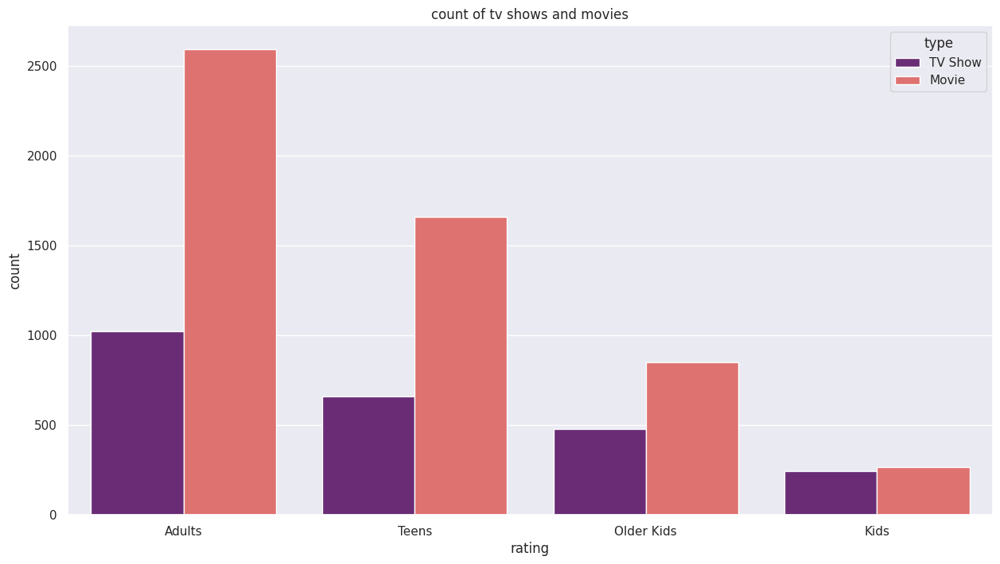

In [ ]:
# plotting a graph to differentiate between tv shows and movies
plt.figure(figsize = (15,8))
sns.countplot(x='rating', hue= 'type', data= df, palette= 'magma')
plt.title('count of tv shows and movies')
plt.show()

*  We found that the no.of adult watching tv shows and movies are greater then any other we see the second top watcher's of netflix is the teen populations followed by older kids being the third top while the count of watching is quite similiar in case of kids

In [ ]:
# column duration
df['duration'].unique()

array(['4 Seasons', '93 min', '78 min', '80 min', '123 min', '1 Season',
       '95 min', '119 min', '118 min', '143 min', '103 min', '89 min',
       '91 min', '149 min', '144 min', '124 min', '87 min', '110 min',
       '128 min', '117 min', '100 min', '2 Seasons', '84 min', '99 min',
       '90 min', '102 min', '104 min', '105 min', '56 min', '125 min',
       '81 min', '97 min', '106 min', '107 min', '109 min', '44 min',
       '75 min', '101 min', '3 Seasons', '37 min', '113 min', '114 min',
       '130 min', '94 min', '140 min', '135 min', '82 min', '70 min',
       '121 min', '92 min', '164 min', '53 min', '83 min', '116 min',
       '86 min', '120 min', '96 min', '126 min', '129 min', '77 min',
       '137 min', '148 min', '28 min', '122 min', '176 min', '85 min',
       '22 min', '68 min', '111 min', '29 min', '142 min', '168 min',
       '21 min', '59 min', '20 min', '98 min', '108 min', '76 min',
       '26 min', '156 min', '30 min', '57 min', '150 min', '133 min',
       '1

In [ ]:
# subsetting for the tv shows and movies
netflix_tv_shows= df[df['type']== 'TV Shows']
netflix_movies= df[df['type']=='Movie']

In [ ]:
# movies duration setting and changing type
netflix_movies['duration']= netflix_movies['duration'].str.replace(' min','')
# changing type to int for visualization
netflix_movies['duration']=netflix_movies['duration'].astype(str).astype(int)
netflix_movies['duration']

<ipython-input-49-57ad8720d3d2>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-49-57ad8720d3d2>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1        93
2        78
3        80
4       123
6        95
       ... 
7781     88
7782     99
7783    111
7784     44
7786     90
Name: duration, Length: 5377, dtype: int64

<ipython-input-50-5bdc36deb8a0>:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




<Axes: xlabel='duration', ylabel='Density'>

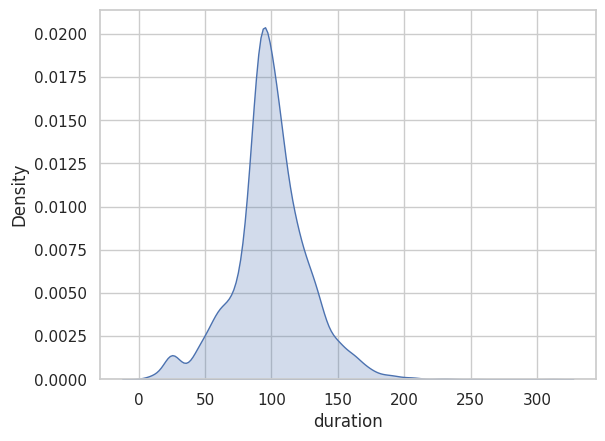

In [ ]:
# duration of movies
sns.set_style('whitegrid')
sns.kdeplot(data=netflix_movies['duration'],shade= True)

* Netflix movies has 70-120 most minutes of duration.

In [ ]:
# analysing the duration of tv_shows
netflix_tv_shows['duration']= netflix_tv_shows['duration'].str.replace(' Season','')
netflix_tv_shows['duration']= netflix_tv_shows['duration'].str.replace(' Seasons','')
netflix_tv_shows['duration']= netflix_tv_shows['duration'].str.replace('s','')
netflix_tv_shows['duration']=netflix_tv_shows['duration'].astype(str).astype(int)
netflix_tv_shows['duration']

Series([], Name: duration, dtype: int64)

<ipython-input-52-4b33f93ecac3>:4: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




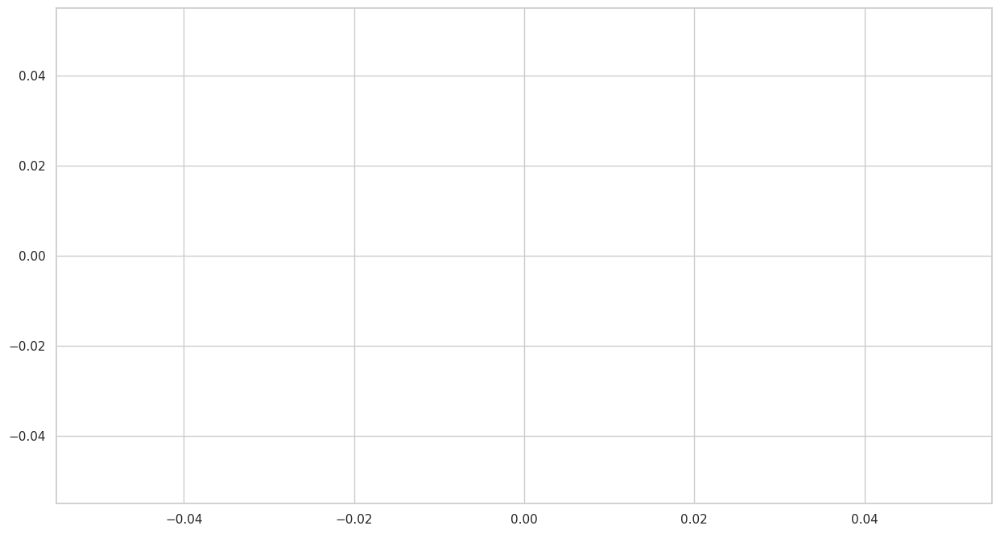

In [ ]:
# # duration of movies
# plt.figure(figsize= (15,8))
# sns.set_style('whitegrid')
# sns.kdeplot(data=netflix_tv_shows['duration'],shade= True)
# x= netflix_tv_shows['duration']

##### Column listed_in

In [ ]:
df['listed_in'].unique
# for this analysis we are creating genres

<bound method Series.unique of 0       International TV Shows, TV Dramas, TV Sci-Fi &...
1                            Dramas, International Movies
2                     Horror Movies, International Movies
3       Action & Adventure, Independent Movies, Sci-Fi...
4                                                  Dramas
                              ...                        
7782                         Dramas, International Movies
7783       Dramas, International Movies, Music & Musicals
7784    Documentaries, International Movies, Music & M...
7785                   International TV Shows, Reality TV
7786                      Documentaries, Music & Musicals
Name: listed_in, Length: 7787, dtype: object>

In [ ]:
no_of_category= []
for categories in df['listed_in'].values:
    len_categories= len(categories.split(','))
    no_of_category.append(len_categories)

In [ ]:
df['no_of_category']= no_of_category

In [ ]:
df[['listed_in','no_of_category']].head()

,listed_in,no_of_category
0,"International TV Shows, TV Dramas, TV Sci-Fi &...",3
1,"Dramas, International Movies",2
2,"Horror Movies, International Movies",2
3,"Action & Adventure, Independent Movies, Sci-Fi...",3
4,Dramas,1


In [ ]:
# creating genre
genre= df.set_index('title').listed_in.str.split(', ',expand= True).stack().reset_index(level= 1, drop= True);
genre

title
3%                                         International TV Shows
3%                                                      TV Dramas
3%                                            TV Sci-Fi & Fantasy
7:19                                                       Dramas
7:19                                         International Movies
                                                    ...          
Zulu Man in Japan                                Music & Musicals
Zumbo's Just Desserts                      International TV Shows
Zumbo's Just Desserts                                  Reality TV
ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS             Documentaries
ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS          Music & Musicals
Length: 17071, dtype: object

Text(0.5, 1.0, 'top 10 genres')

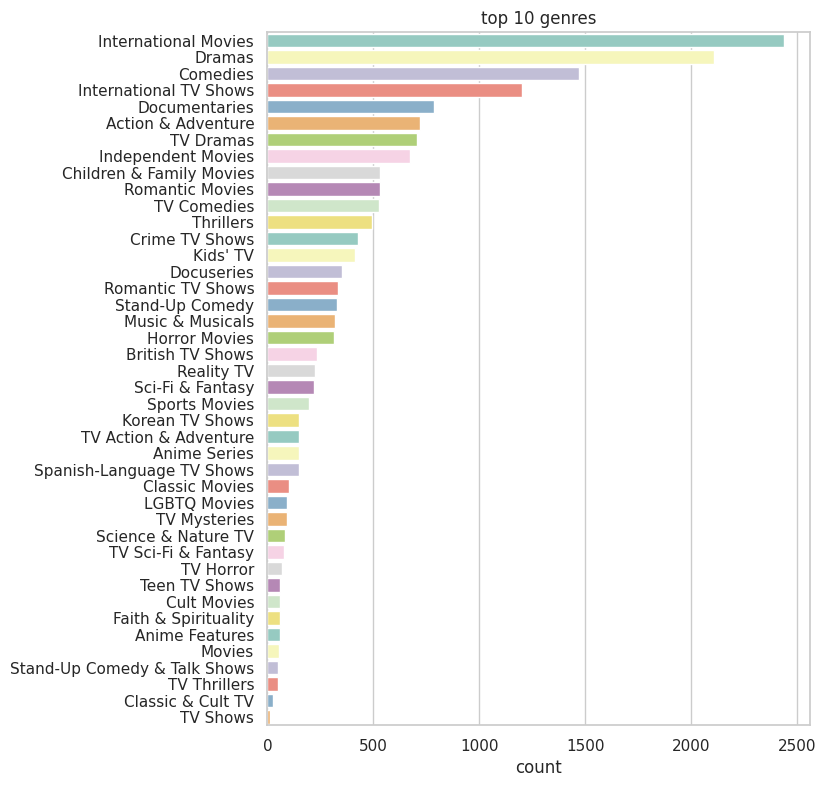

In [ ]:
# visualizing the above result
plt.figure(figsize= (7,9))
g = sns.countplot(y= genre, order= genre.value_counts().index ,palette='Set3')
plt.title('top 10 genres')

<function matplotlib.pyplot.show(close=None, block=None)>

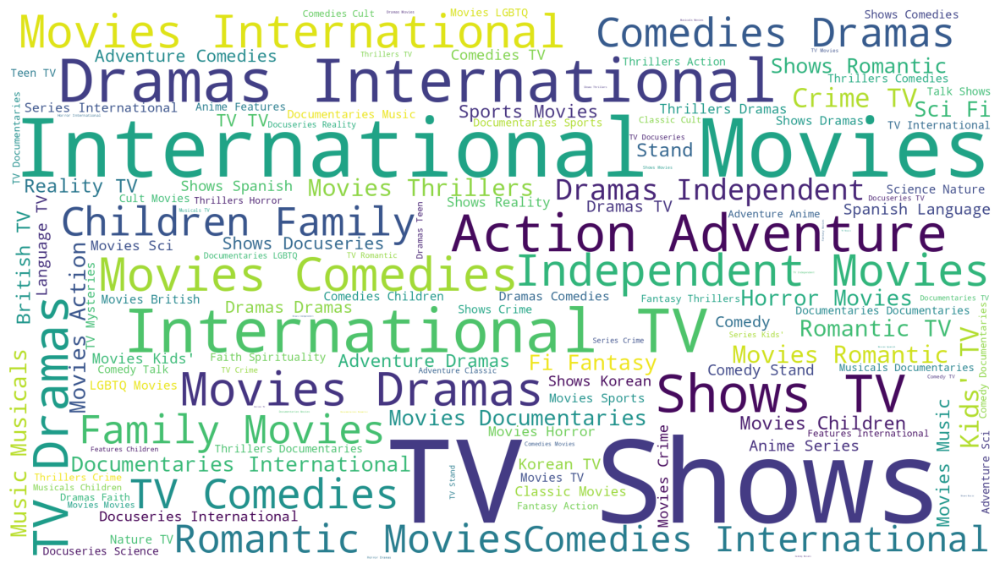

In [ ]:
# drawing a word graph
plt.subplots(figsize= (15,15))
# generating the word cloud image
wordcloud= WordCloud(
                    background_color= 'white',
                    width= 1920,
                    height= 1080
                    ).generate(" ".join(genre))
# displaying the generated image
plt.imshow(wordcloud)
plt.axis('off')
plt.show

*  We found that international movies, tv shows, international dramas, comedies, adventure, action are in huge demand on netflix. Even though usa is the top country, netflix has most number of international genres

In [ ]:
df['genre'] = df['listed_in'].apply(lambda x: x.split(',')[0])

In [ ]:
df['genre'].value_counts()

Dramas                          1384
Comedies                        1074
Documentaries                    751
Action & Adventure               721
International TV Shows           690
Children & Family Movies         502
Crime TV Shows                   369
Kids' TV                         359
Stand-Up Comedy                  321
Horror Movies                    244
British TV Shows                 232
Docuseries                       194
Anime Series                     148
International Movies             114
TV Comedies                      110
Reality TV                       102
Classic Movies                    77
TV Dramas                         62
Movies                            56
Thrillers                         49
TV Action & Adventure             37
Stand-Up Comedy & Talk Shows      33
Romantic TV Shows                 28
Classic & Cult TV                 21
Independent Movies                20
Anime Features                    19
Music & Musicals                  17
T

### Bivariate Analysis
Country wise trend anaysis

In [ ]:
# country vs genre trend
df['country'].nunique

<bound method IndexOpsMixin.nunique of 0                                                  Brazil
1                                                  Mexico
2                                               Singapore
3                                           United States
4                                           United States
                              ...                        
7782    Sweden, Czech Republic, United Kingdom, Denmar...
7783                                                India
7784                                                  NaN
7785                                            Australia
7786                United Kingdom, Canada, United States
Name: country, Length: 7787, dtype: object>

In [ ]:
# creating a function for genres country wise
def genre_country_trend(df):
    def explore_country(country):
        #executing split on the basis of ',' or otherwise return ''
        try:
            return country.split(', ')
        except:
            return ''
    # executing separate country list and genre list
    df['country_list']= df.apply(lambda x: explore_country(x['country']),axis =1)
    df= df.explode('country_list')

    df['genre_list']= df.apply(lambda x: explore_country(x['listed_in']),axis= 1)
    df= df.explode('genre_list')


    #finding country and their preferred genres
    df.groupby(['country_list','genre_list']).agg({'title': 'count'})
    grouped_df= df.groupby(['country_list','genre_list']).agg({'title': 'count'})
    grouped_df= grouped_df.reset_index()
    grouped_df['country_list'].values
    grouped_df= grouped_df[grouped_df['country_list'] != '']
    rating_country_df= grouped_df.reset_index().drop('index',axis=1)

    # visualizing country vs genre trend
    list_of_countries= list(set(list(rating_country_df['country_list'].values)))
    for each in list_of_countries:
        rating_country_df[rating_country_df['country_list']== each].sort_values('title', ascending= False).plot.bar(x= 'genre_list')
        plt.title(f'{each}')
    return rating_country_df

/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/core.py:386: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



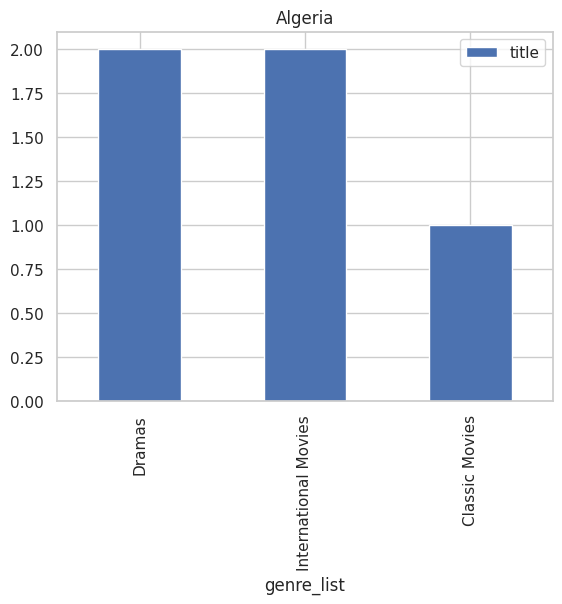

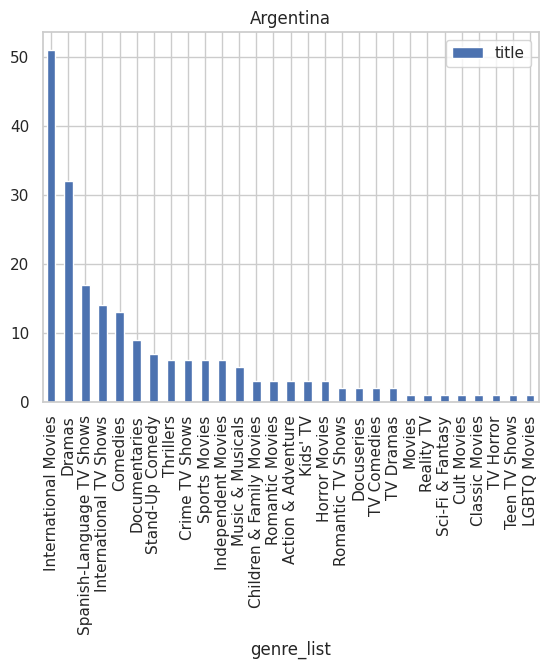

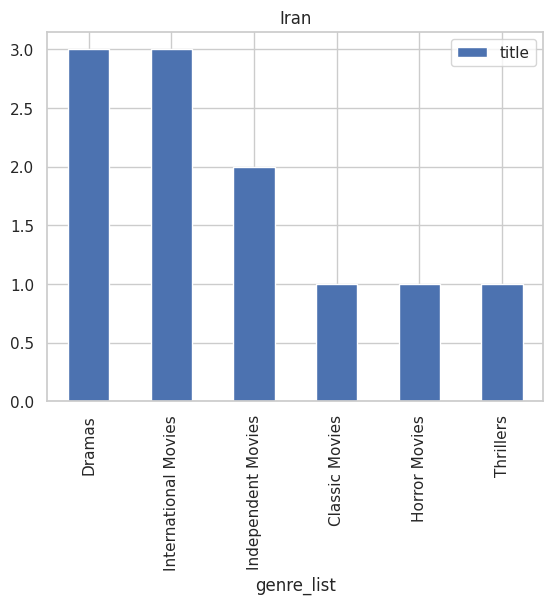

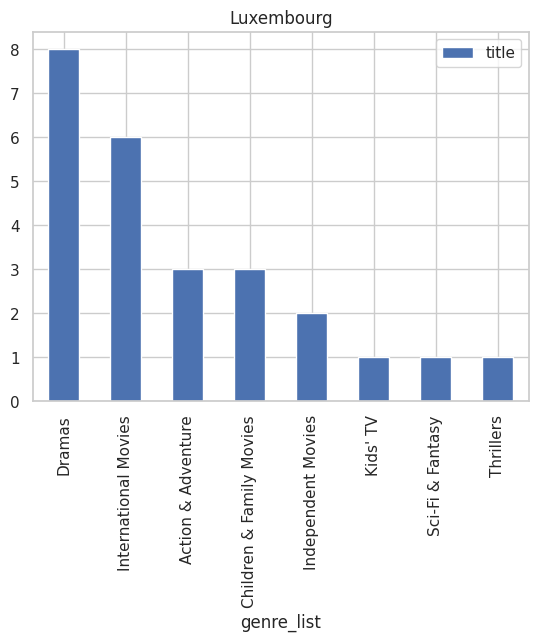

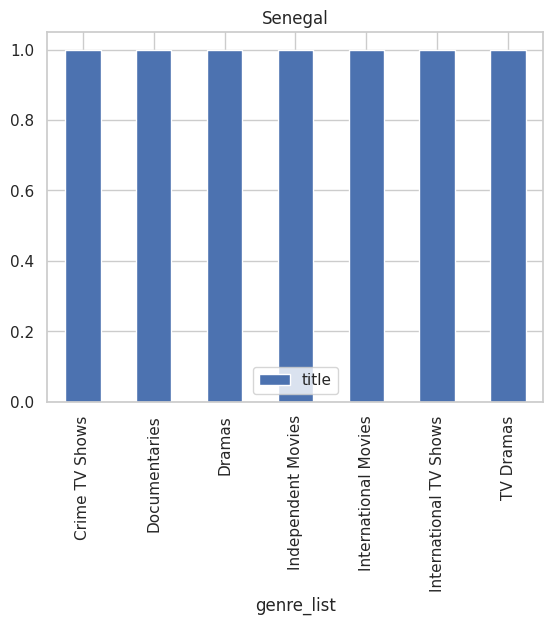

...

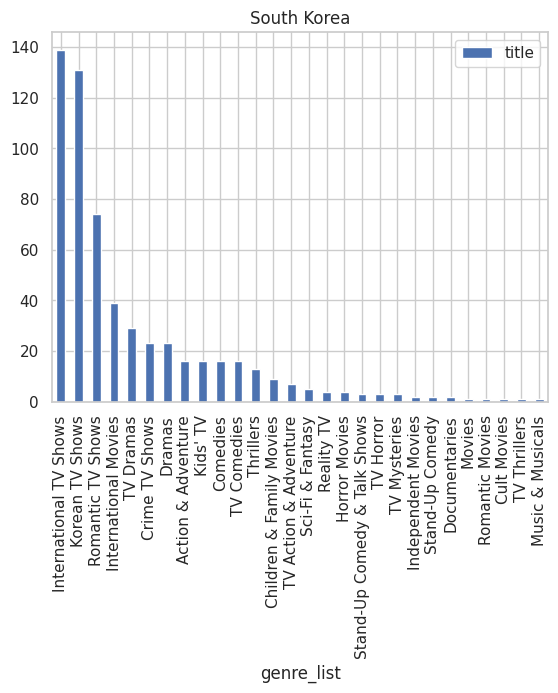

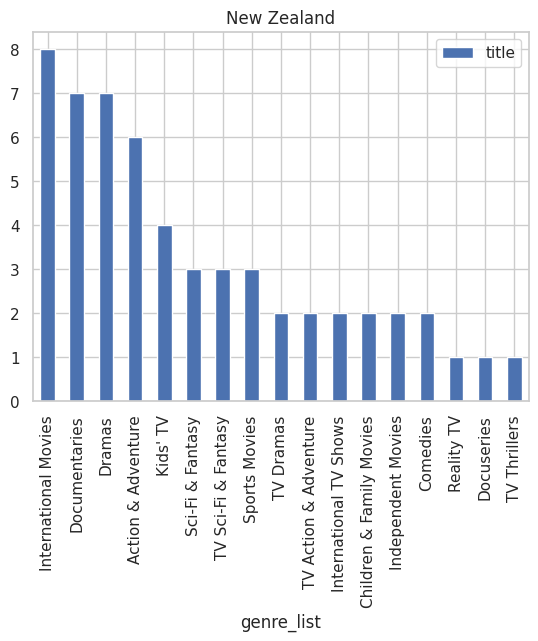

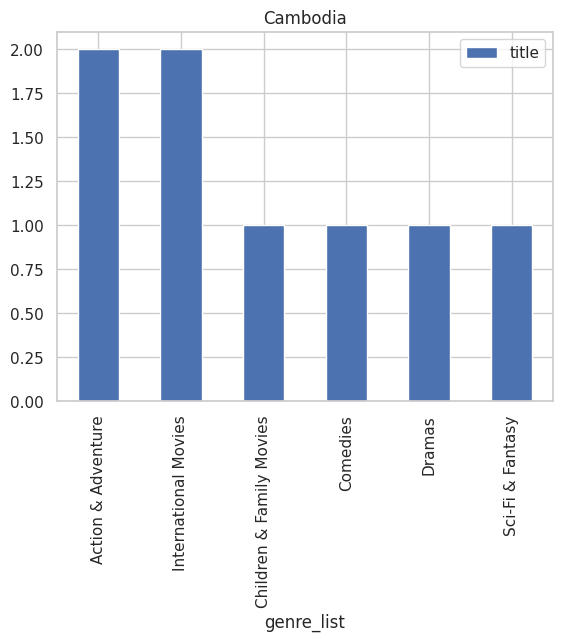

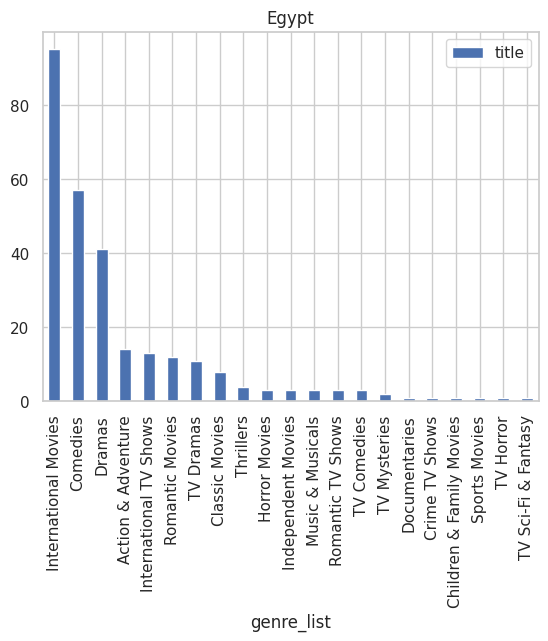

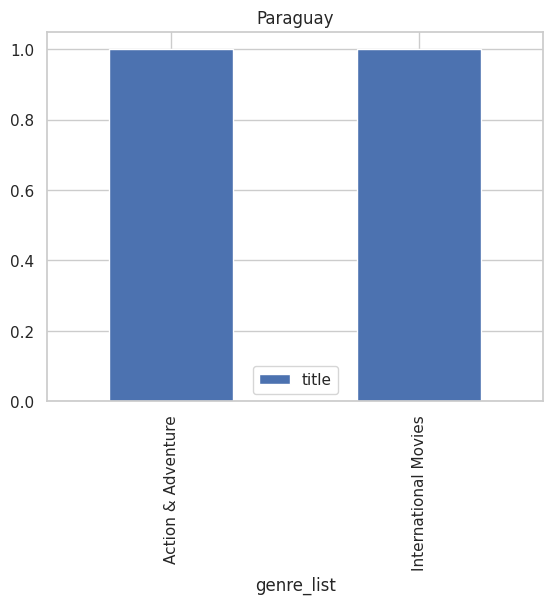

In [ ]:
rating_country_df= genre_country_trend(df)

*   We found France has more number of watches over international drama and secondly on Dramas
*   Japan has more watches towards international tv shows and anime series
*   India has most watches towards international movies and secondly on Dramas
*   People in Korea watch more international tv shows and koream tv shows
*   People of Somalia watch only Dramas
*   China watch more of international movies, action and adventure.
*   Cambodian population watch Dramas and international movies.
*   Canadian has maximum watches towards comedies, Secondaly Dramas,the youth watch more of a children and family movies
*  United States has maximum watches towards Dramas, Comedies, Documentaries.
*   Bulgarian has most watches towards Action and adventure then the second highest over there is international movies then thrillers.

In [ ]:
# word cloud for the top countries
def word_cloud(rating_country_df):
    country_list= ['United States','India', 'United Kingdom','France', 'China']
    # using word cloud to identify the most used word
    from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
    for items in country_list:
        plt.rcParams['figure.figsize']= (10,10)
        wordcloud= WordCloud(stopwords= STOPWORDS, background_color= 'white', width= 1000, height= 500, max_words=121).generate(" ".join(genre))
        plt.imshow(wordcloud)
        plt.axis('off')
        plt.title(f'most popular genres for {items}', fontsize = 10)
        plt.show()

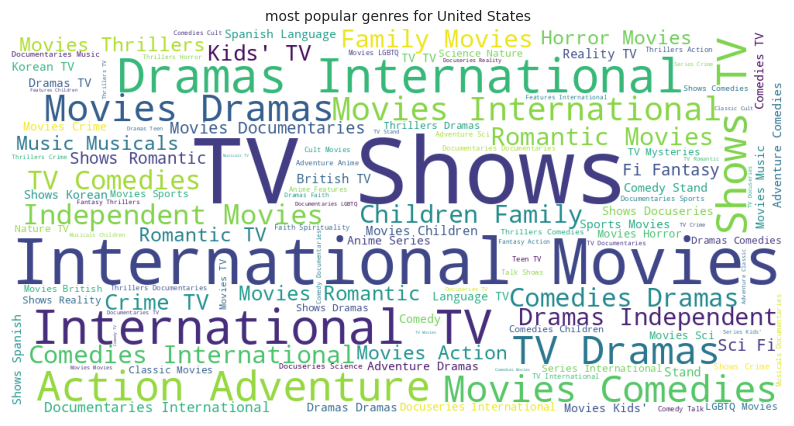

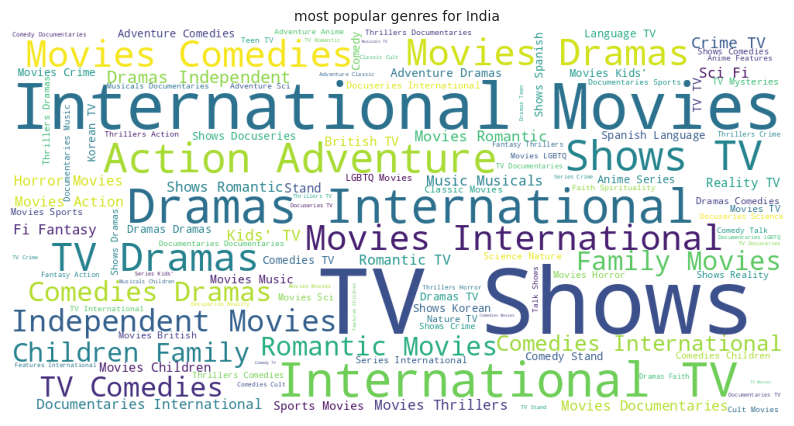

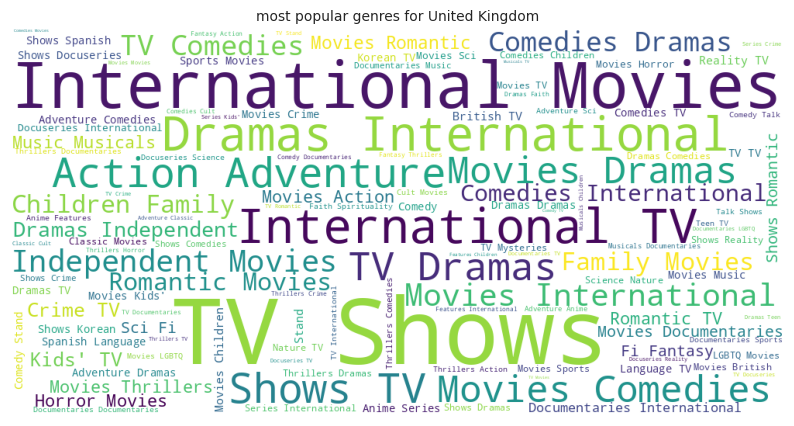

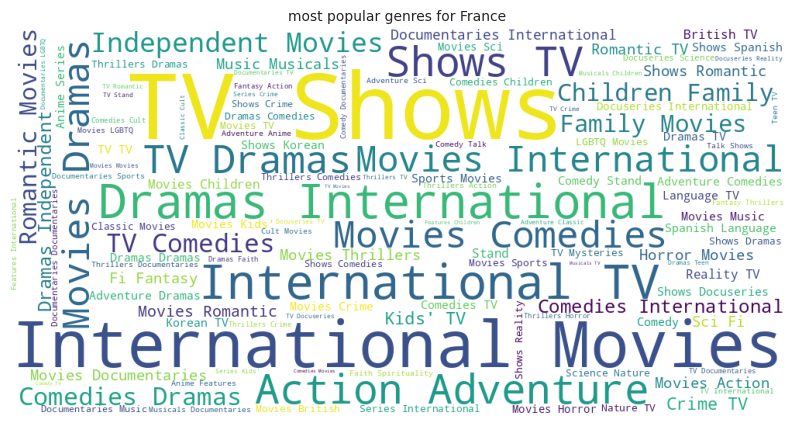

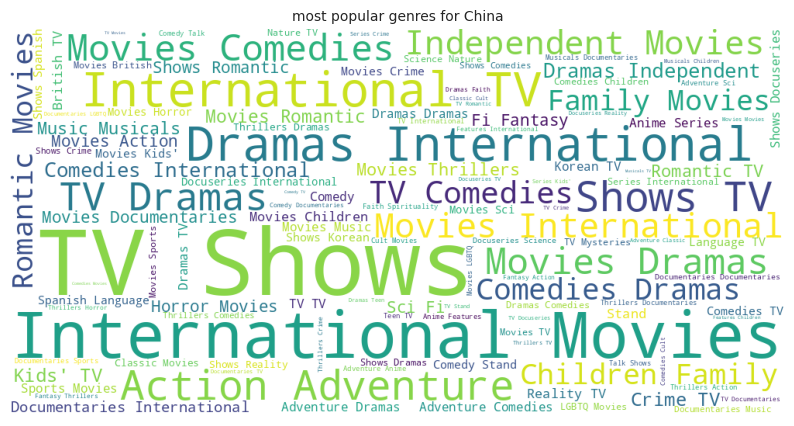

In [ ]:
word_cloud(rating_country_df)

*  We found that international tv shows and movies are most popular in these countries.
*  International dramas, action, adventure and movies are most preferred by chinese people.
*  France has more population driven towards tv shows and international movies, tv, action and adventure
*  The people in united kingdom watch more number of international dramas, movies shows, etc.
* Indian people are more driven towards international movies, tv, action, adventure, drama and shows*

In [ ]:
# country vs rating analysis
# creating a function for genres country wise
def rating_country_trend(df):
    def explore_country(country):
        #executing split on the basis of ',' or otherwise return ''
        try:
            return country.split(', ')
        except:
            return ''
    # executing separate country list and genre list
    df['country_list']= df.apply(lambda x: explore_country(x['country']),axis =1)
    df= df.explode('country_list')

#     df['rating_list']= df.apply(lambda x: explore_country(x['listed_in']),axis= 1)
#     df= df.explode('rating_list')

    #finding country and their preferred genres
    df.groupby(['country_list','genre_list])

SyntaxError: ignored

In [ ]:
# country vs rating analysis
# creating a function for genres country wise
def rating_country_trend(df):
    def explore_country(country):
        #executing split on the basis of ',' or otherwise return ''
        try:
            return country.split(', ')
        except:
            return ''
    # executing separate country list and genre list
    df['country_list']= df.apply(lambda x: explore_country(x['country']),axis =1)
    df= df.explode('country_list')

#     df['rating_list']= df.apply(lambda x: explore_country(x['listed_in']),axis= 1)
#     df= df.explode('rating_list')

    #finding country and their preferred genres
#     df.groupby(['country_list','rating']).agg({'title': 'count'})
    grouped_df= df.groupby(['country_list','rating']).agg({'title': 'count'})
    grouped_df= grouped_df.reset_index()
    grouped_df['country_list'].values
    grouped_df= grouped_df[grouped_df['country_list'] != '']
    rating_country_df= grouped_df.reset_index().drop('index',axis=1)

    # visualizing country vs genre trend
    list_of_countries= list(set(list(rating_country_df['country_list'].values)))
    for each in list_of_countries:
        rating_country_df[rating_country_df['country_list']== each].sort_values('title', ascending= False).plot.bar(x= 'rating')
        plt.title(f'{each}')
    return rating_country_df

/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/core.py:386: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



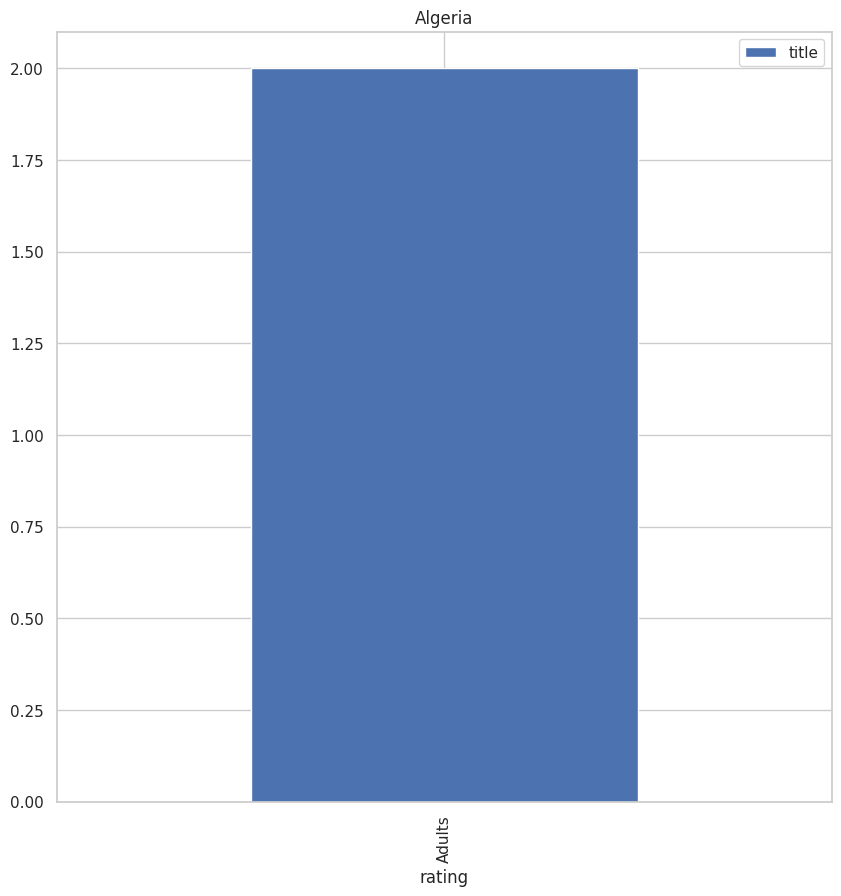

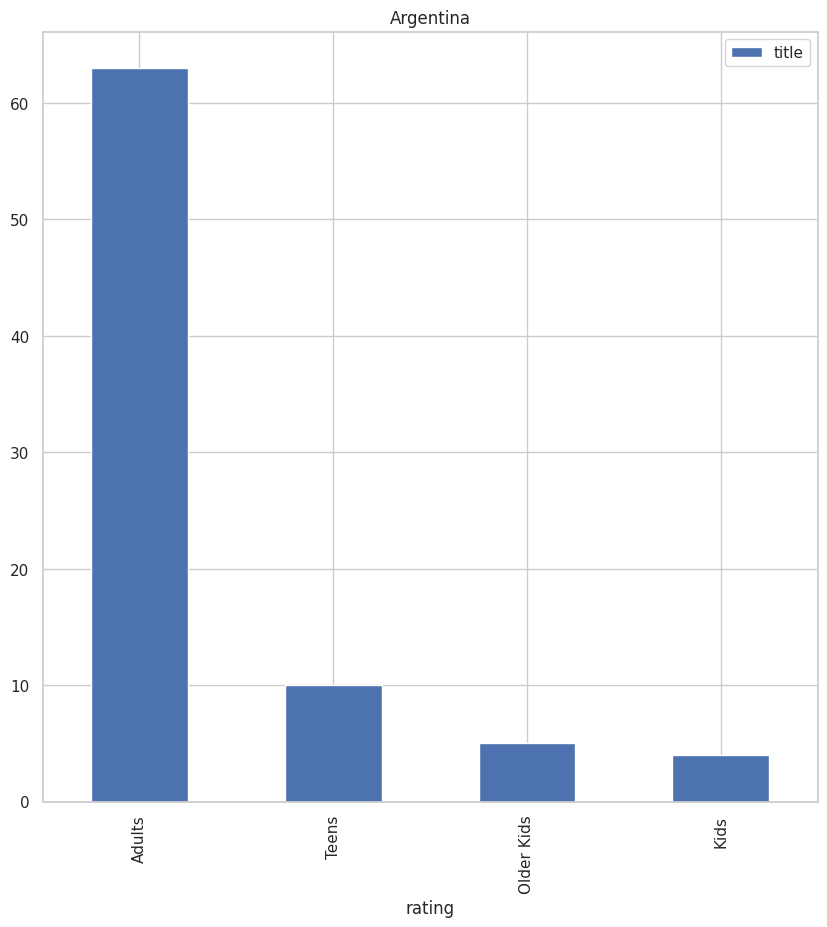

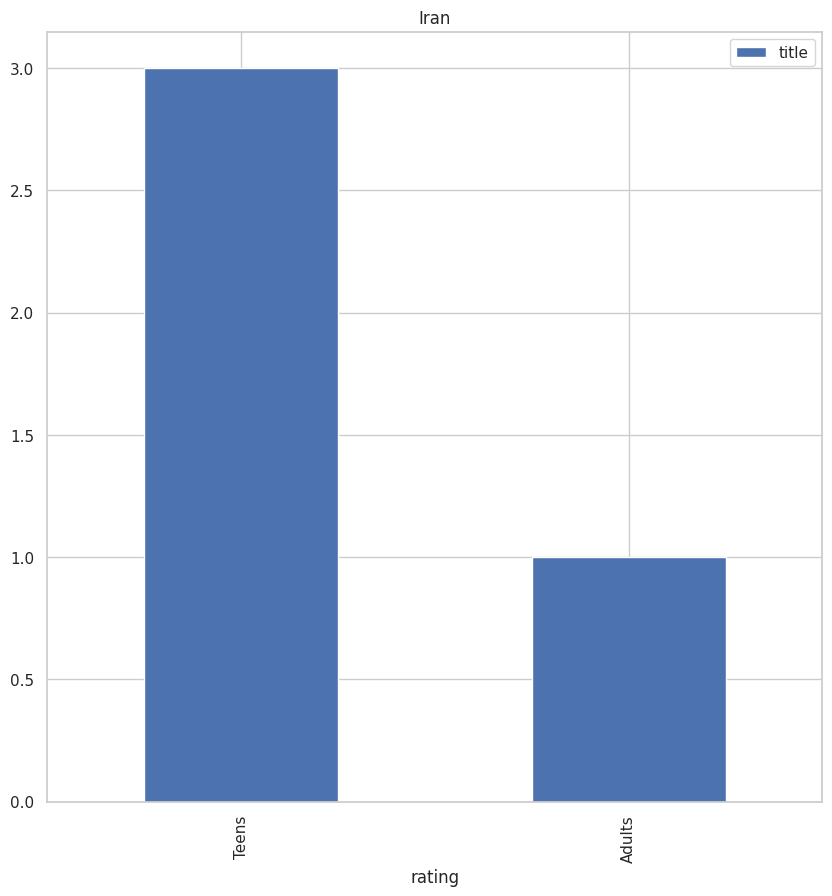

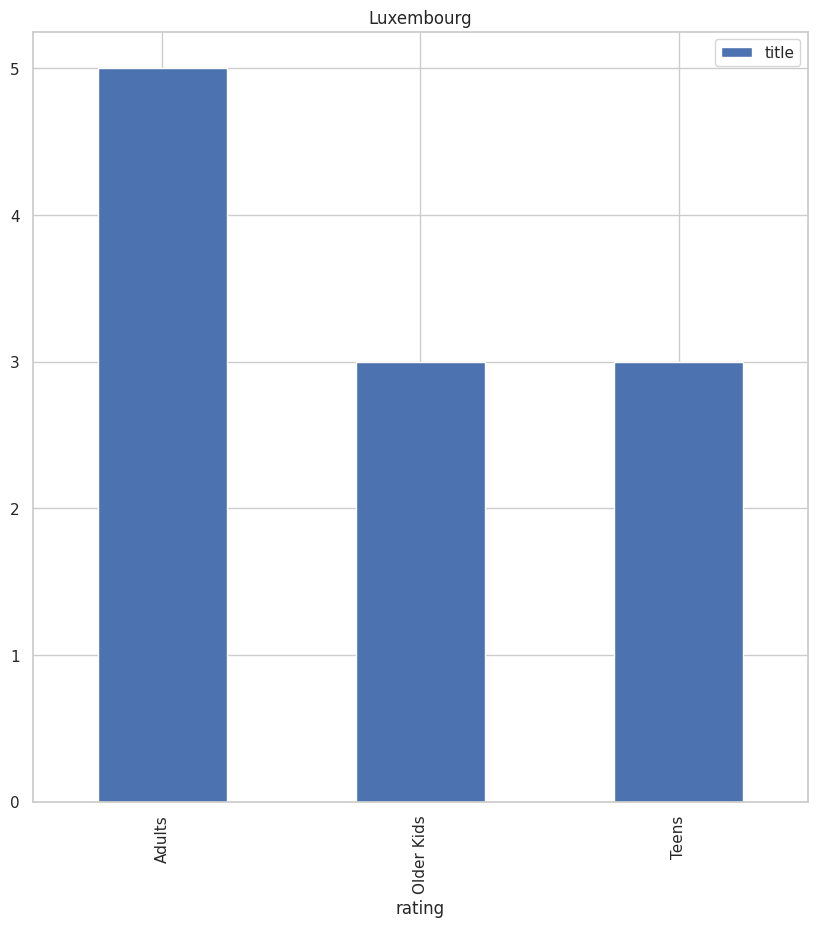

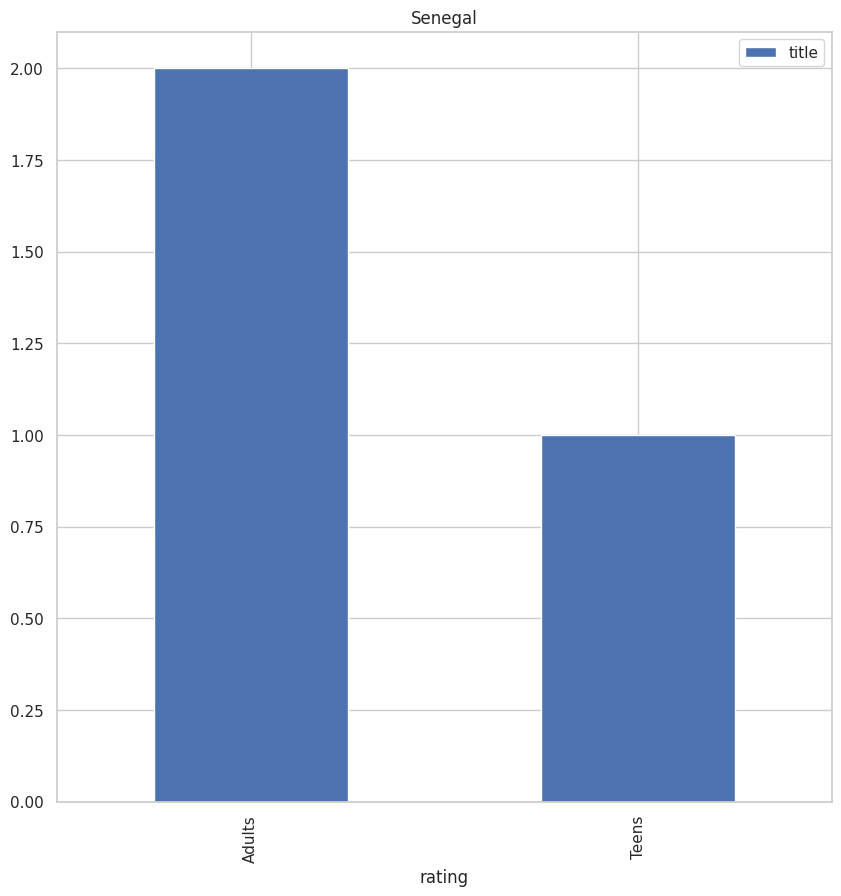

...

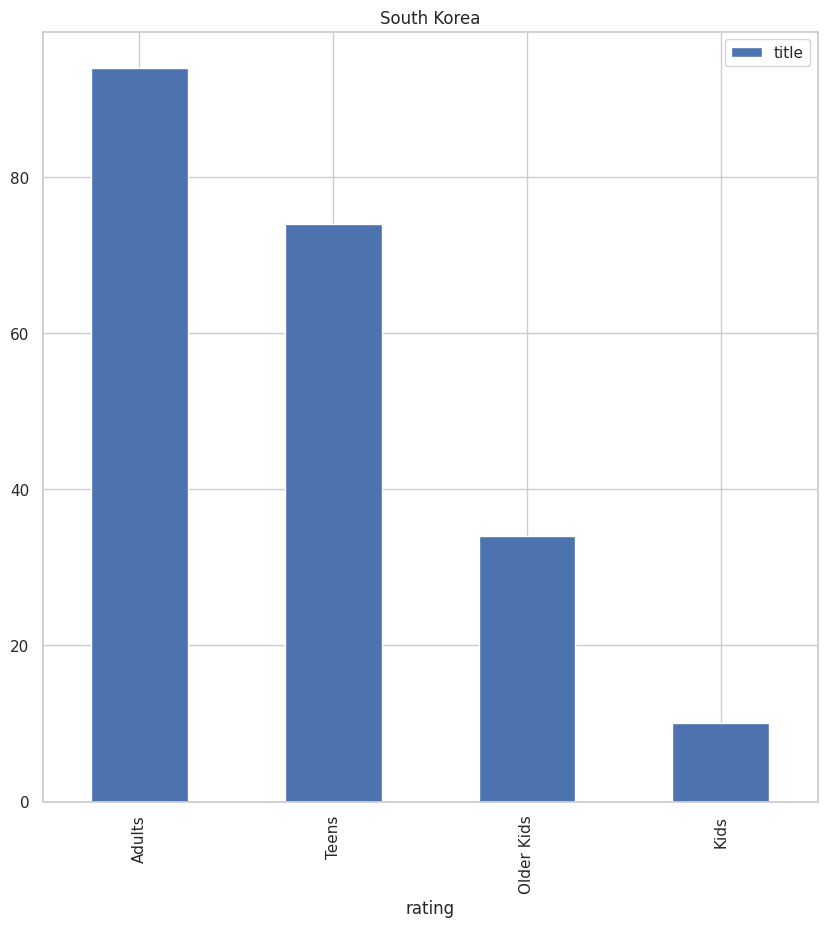

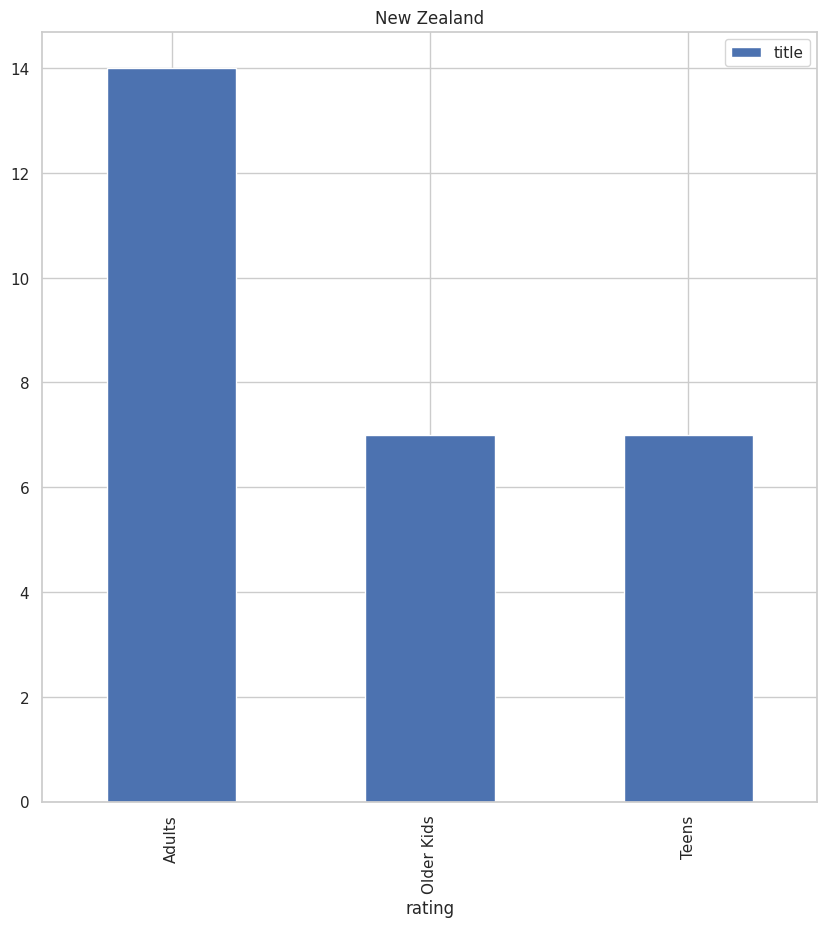

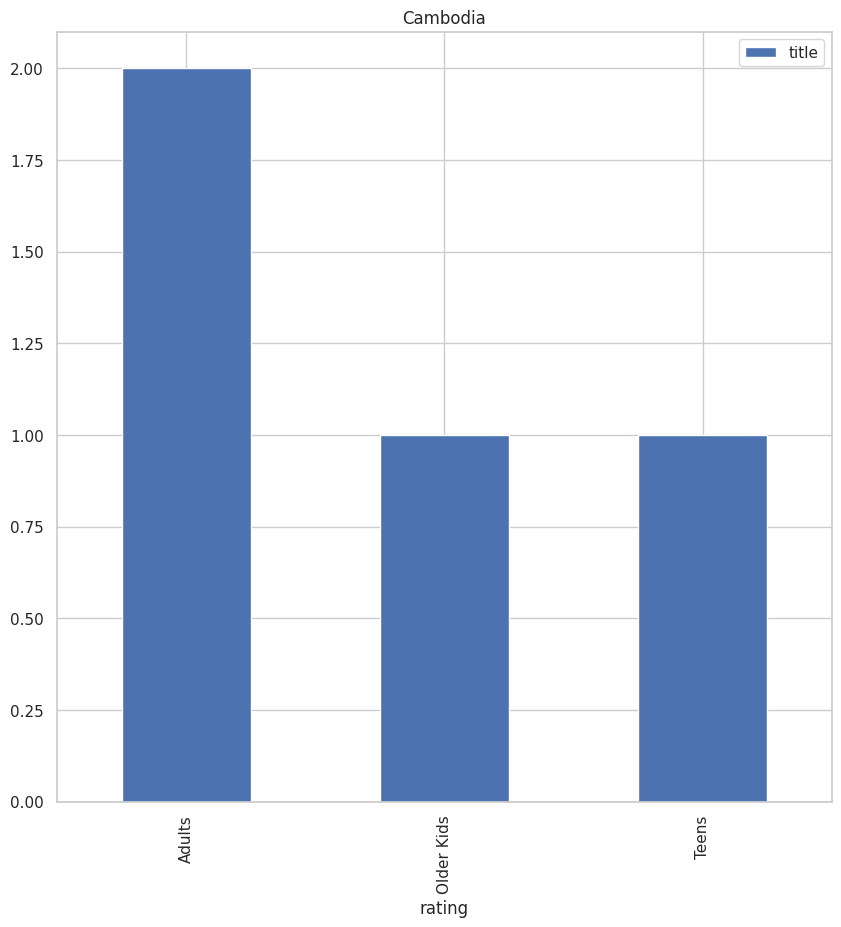

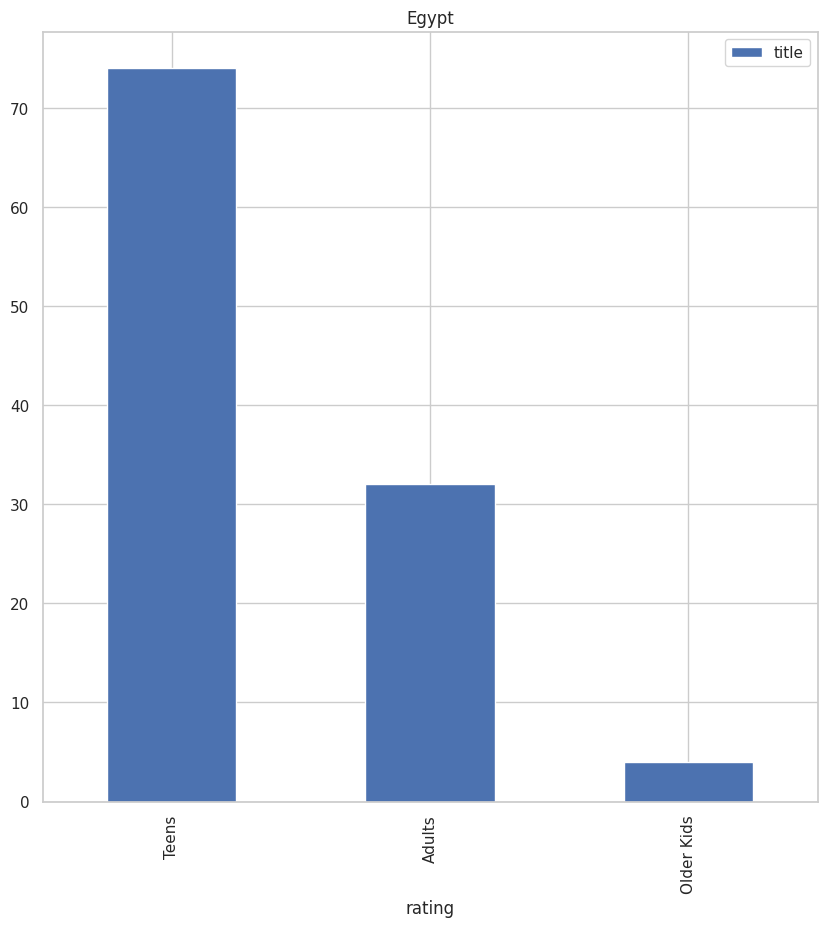

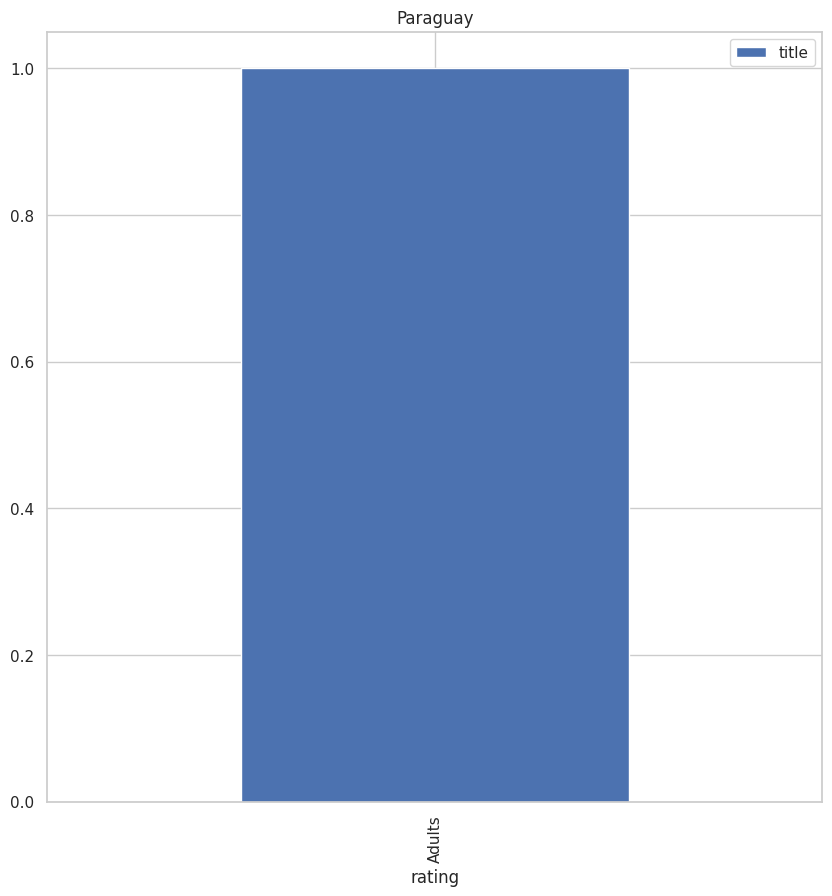

In [ ]:
rating_country_df= rating_country_trend(df)

* inference based on country vs rating
  * France and Japan has most rating on adults then teems then older kids and lastly on kids.
  * India has most rating towards teens then adults then older kids and then kids
  * New Zealand has maximum rating on adults then older kids then teens

In [ ]:
# country vs rating analysis
# creating a function for genres country wise
def type_country_trend(df):
    def explore_country(country):
        #executing split on the basis of ',' or otherwise return ''
        try:
            return country.split(', ')
        except:
            return ''
    # executing separate country list and genre list
    df['country_list']= df.apply(lambda x: explore_country(x['country']),axis =1)
    df= df.explode('country_list')

#     df['rating_list']= df.apply(lambda x: explore_country(x['listed_in']),axis= 1)
#     df= df.explode('rating_list')

    #finding country and their preferred genres
#     df.groupby(['country_list','rating']).agg({'title': 'count'})
    grouped_df= df.groupby(['country_list','type']).agg({'title': 'count'})
    grouped_df= grouped_df.reset_index()
    grouped_df['country_list'].values
    grouped_df= grouped_df[grouped_df['country_list'] != '']
    rating_country_df= grouped_df.reset_index().drop('index',axis=1)

    # visualizing country vs genre trend
    list_of_countries= list(set(list(rating_country_df['country_list'].values)))
    for each in list_of_countries:
        rating_country_df[rating_country_df['country_list']== each].sort_values('title', ascending= False).plot.bar(x= 'type', y= '')
        plt.title(f'{each}')
    return rating_country_df

In [ ]:
df.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   show_id            7787 non-null   object        
 1   type               7787 non-null   object        
 2   title              7787 non-null   object        
 3   director           7787 non-null   object        
 4   cast               7787 non-null   object        
 5   country            7280 non-null   object        
 6   date_added         7777 non-null   datetime64[ns]
 7   release_year       7787 non-null   int64         
 8   rating             7780 non-null   object        
 9   duration           7787 non-null   object        
 10  listed_in          7787 non-null   object        
 11  description        7787 non-null   object        
 12  year_added         7777 non-null   float64       
 13  month_added        7777 non-null   float64       
 14  no_of_ca

*  Preferred month to release movies by netflix

Text(0.5, 1.0, 'monthly content on netflix')

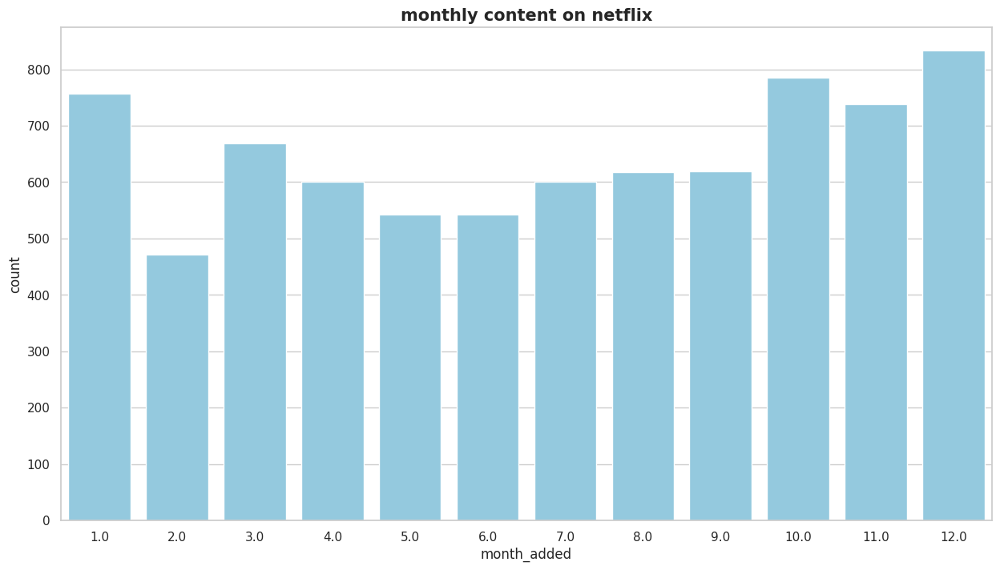

In [ ]:
plt.figure(figsize= (15,8))
sns.countplot(x= df['month_added'], color='skyblue')
plt.title('monthly content on netflix', fontsize= 15, fontweight= 'bold')

In [ ]:
# inference

### Preprocessing and nlp

In [ ]:
df.description.iloc[0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

In [ ]:
first_description= df.description.iloc[0]

*  Remove punctuation
1.  punctuation does not carry any meaning in the cluster.
2. if punctuation is present in the cluster it will add up noise to the data
removing the punctuation is the better option

In [ ]:
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk.stem.snowball import SnowballStemmer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import string

In [ ]:
def remove_punctuation(text):
    translator = str.maketrans('', '',string.punctuation)
    return text.translate(translator)

In [ ]:
df['description']= df['description'].apply(remove_punctuation)
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,no_of_category,genre,country_list,length(listed_in)
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,Adults,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020.0,8.0,3,International TV Shows,[Brazil],54
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,Adults,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016.0,12.0,2,Dramas,[Mexico],28
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,Adults,78 min,"Horror Movies, International Movies",When an army recruit is found dead his fellow ...,2018.0,12.0,2,Horror Movies,[Singapore],35
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,Teens,80 min,"Action & Adventure, Independent Movies, Sci-Fi...",In a postapocalyptic world ragdoll robots hide...,2017.0,11.0,3,Action & Adventure,[United States],56
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,Teens,123 min,Dramas,A brilliant group of students become cardcount...,2020.0,1.0,1,Dramas,[United States],6


*  Removing punctuation
1. stop words are commonly used words in any language, not just english.
2. removing stop words helps us to focus on the important words.

##### Removing the stop words from nltk library

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
st= nltk.corpus.stopwords.words('english')
# displaying the stopwords
for i in st:
    print(i , end= ",   ")

i,   me,   my,   myself,   we,   our,   ours,   ourselves,   you,   you're,   you've,   you'll,   you'd,   your,   yours,   yourself,   yourselves,   he,   him,   his,   himself,   she,   she's,   her,   hers,   herself,   it,   it's,   its,   itself,   they,   them,   their,   theirs,   themselves,   what,   which,   who,   whom,   this,   that,   that'll,   these,   those,   am,   is,   are,   was,   were,   be,   been,   being,   have,   has,   had,   having,   do,   does,   did,   doing,   a,   an,   the,   and,   but,   if,   or,   because,   as,   until,   while,   of,   at,   by,   for,   with,   about,   against,   between,   into,   through,   during,   before,   after,   above,   below,   to,   from,   up,   down,   in,   out,   on,   off,   over,   under,   again,   further,   then,   once,   here,   there,   when,   where,   why,   how,   all,   any,   both,   each,   few,   more,   most,   other,   some,   such,   no,   nor,   not,   only,   own,   same,   so,   than,   to

In [ ]:
print('Number of stopwords in english are: ',len(st) )

Number of stopwords in english are:  179


In [ ]:
sw = stopwords.words('english')
# np.array(sw)
# print("Number of stopwords: ", len(sw))
def stopwords(text):
    text = [word.lower() for word in text.split() if word.lower() not in sw]
    return " ".join(text)

In [ ]:
df['description']= df['description'].apply(stopwords)
df.head().T

,0,1,2,3,4
show_id,s1,s2,s3,s4,s5
type,TV Show,Movie,Movie,Movie,Movie
title,3%,7:19,23:59,9,21
director,,Jorge Michel Grau,Gilbert Chan,Shane Acker,Robert Luketic
cast,"João Miguel, Bianca Comparato, Michel Gomes, R...","Demián Bichir, Héctor Bonilla, Oscar Serrano, ...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ...","Elijah Wood, John C. Reilly, Jennifer Connelly...","Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar..."
country,Brazil,Mexico,Singapore,United States,United States
date_added,2020-08-14 00:00:00,2016-12-23 00:00:00,2018-12-20 00:00:00,2017-11-16 00:00:00,2020-01-01 00:00:00
release_year,2020,2016,2011,2009,2008
rating,Adults,Adults,Adults,Teens,Teens
duration,4 Seasons,93 min,78 min,80 min,123 min


##### Using CountVectorizer

*  count vocabulary items using CountVectorizer
* counting vocabulary items is the important step in nlp
* it extract the most frequent used words from a particular column and create an dictionary which
* further use in text normalization process(stemming).

In [ ]:
# create a count vectorizer object
count_vectorizer= CountVectorizer()
# fit the count vectorizer using text data
count_vectorizer.fit(df['description'])
# create the vocabulary object used in the vectorizer
dictionary= count_vectorizer.vocabulary_.items()

In [ ]:
dictionary

dict_items([('future', 7161), ('elite', 5647), ('inhabit', 8953), ('island', 9229), ('paradise', 12681), ('far', 6403), ('crowded', 4233), ('slums', 16100), ('get', 7357), ('one', 12309), ('chance', 3060), ('join', 9447), ('saved', 15203), ('squalor', 16516), ('devastating', 4829), ('earthquake', 5496), ('hits', 8314), ('mexico', 11109), ('city', 3326), ('trapped', 17918), ('survivors', 17064), ('walks', 18876), ('life', 10176), ('wait', 18853), ('rescued', 14520), ('trying', 18060), ('desperately', 4782), ('stay', 16625), ('alive', 781), ('army', 1222), ('recruit', 14240), ('found', 6944), ('dead', 4496), ('fellow', 6531), ('soldiers', 16225), ('forced', 6880), ('confront', 3782), ('terrifying', 17440), ('secret', 15392), ('thats', 17494), ('haunting', 8018), ('jungle', 9542), ('training', 17875), ('camp', 2751), ('postapocalyptic', 13360), ('world', 19313), ('ragdoll', 13959), ('robots', 14846), ('hide', 8193), ('fear', 6482), ('dangerous', 4423), ('machines', 10536), ('exterminate',

In [ ]:
vocab= []
count_of_vocab= []
for key,value in dictionary:
    vocab.append(key)
    count_of_vocab.append(value)

##### **Stemming**
Create a new dataframe vocab before stemming

In [ ]:
# store the count in pandas dataframe as index
vocab_before_stemming= pd.DataFrame({'Words': vocab,
                                   'count': count_of_vocab})
# store the dataframe
vocab_before_stemming= vocab_before_stemming.sort_values('count',ascending= False)

In [ ]:
vocab_before_stemming.head(20)

,Words,count
18869,şeref,19607
10401,ōarai,19606
12385,łukasz,19605
11110,überelite,19604
11681,über,19603
13302,ömer,19602
6591,émile,19601
18207,ángel,19600
10439,álvaro,19599
9872,álex,19598


##### Text Normalization
*  stemming
* stemming lets us standarized words to their base stem irrespective of their inflection, which helps many applications like clustering or classifying text.
* text engine use this technique extensively to give better results irrespective of the word from.
* when creating the search index we take similar terms and stem them to a root word so that searcheson other form of the word match our document.

##### we will be using SnowballStemmer('english')

In [ ]:
#  create an object of stem vectorizer
stemmer= SnowballStemmer('english')

In [ ]:
def apply_stemming(text):
    text= [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
df['description']= df['description'].apply(apply_stemming)
df.head().

,0,1,2,3,4
show_id,s1,s2,s3,s4,s5
type,TV Show,Movie,Movie,Movie,Movie
title,3%,7:19,23:59,9,21
director,,Jorge Michel Grau,Gilbert Chan,Shane Acker,Robert Luketic
cast,"João Miguel, Bianca Comparato, Michel Gomes, R...","Demián Bichir, Héctor Bonilla, Oscar Serrano, ...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ...","Elijah Wood, John C. Reilly, Jennifer Connelly...","Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar..."
country,Brazil,Mexico,Singapore,United States,United States
date_added,2020-08-14 00:00:00,2016-12-23 00:00:00,2018-12-20 00:00:00,2017-11-16 00:00:00,2020-01-01 00:00:00
release_year,2020,2016,2011,2009,2008
rating,Adults,Adults,Adults,Teens,Teens
duration,4 Seasons,93 min,78 min,80 min,123 min


### tfid vectorization
* TF-IDF is an abbrevation for term frequency inverse document frequency. This is very common algorithm to transfer text into a meaningful representation of numbers which is used to fit in machine learning algorithm for prediction
*  Tf-idf contains information on more important words and less important words as well
*  Tf gives us information on how often a term appears in a document and idf gives us information about relative rarity of a term in the collection of documents.#

In [ ]:
# creating object for Tf-idf Vectorizer
tfidf_vectorizer = TfidfVectorizer()

In [ ]:
tfidf_vectorizer.fit(df['description'])
dictionary = tfidf_vectorizer.vocabulary_.items()

In [ ]:
vocab= []
count_of_vocab= []
for key,value in dictionary:
    vocab.append(key)
    count_of_vocab.append(value)

In [ ]:
# store the count in pandas dataframe as index
vocab_after_stemming= pd.DataFrame({'Words': vocab,
                                   'count': count_of_vocab})
# store the dataframe
vocab_after_stemming= vocab_before_stemming.sort_values('count',ascending= False)

In [ ]:
top_15most_occured_vocab= vocab_after_stemming.head(15)
top_15most_occured_words= top_15most_occured_vocab.Words.values
top_15most_occured_words

array(['şeref', 'ōarai', 'łukasz', 'überelite', 'über', 'ömer', 'émile',
       'ángel', 'álvaro', 'álex', 'zé', 'zurich', 'zumbo', 'zulu', 'zuhu'],
      dtype=object)

In [ ]:
top15_most_occured_word_count= top_15most_occured_vocab['count'].values
top15_most_occured_word_count

array([19607, 19606, 19605, 19604, 19603, 19602, 19601, 19600, 19599,
       19598, 19597, 19596, 19595, 19594, 19593])

<BarContainer object of 15 artists>

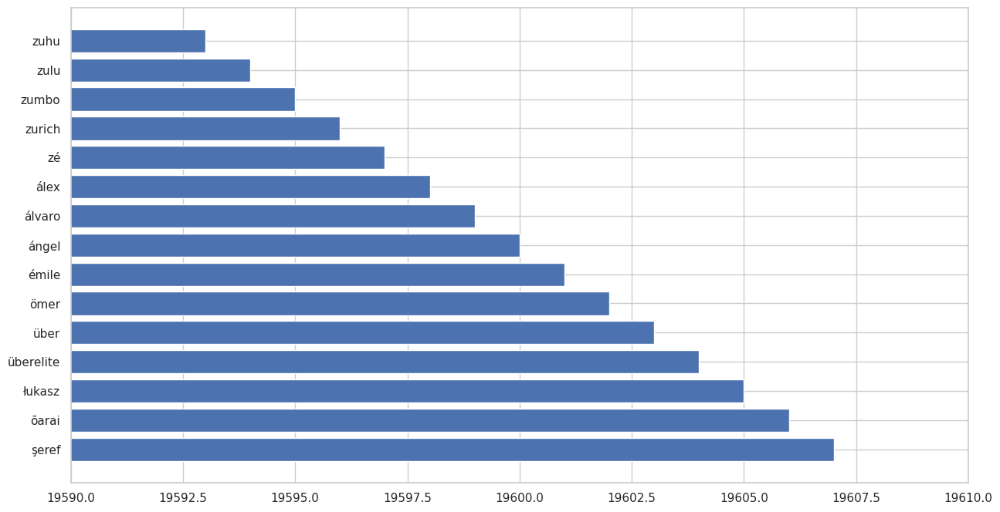

In [ ]:
plt.figure(figsize= (15,8))
plt.xlim(19590,19610)
plt.barh(top_15most_occured_words,top15_most_occured_word_count)

In [ ]:
df['length(description)'] = df['description'].apply(lambda x: len(x))
df.head(3).T

,0,1,2
show_id,s1,s2,s3
type,TV Show,Movie,Movie
title,3%,7:19,23:59
director,,Jorge Michel Grau,Gilbert Chan
cast,"João Miguel, Bianca Comparato, Michel Gomes, R...","Demián Bichir, Héctor Bonilla, Oscar Serrano, ...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."
country,Brazil,Mexico,Singapore
date_added,2020-08-14 00:00:00,2016-12-23 00:00:00,2018-12-20 00:00:00
release_year,2020,2016,2011
rating,Adults,Adults,Adults
duration,4 Seasons,93 min,78 min


In [ ]:
df['description'].iloc[0]

'futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalor'

In [ ]:
len(df['description'].iloc[0])

82

#### for features in listed_in

In [ ]:
df['listed_in']= df['listed_in'].apply(remove_punctuation)
df.head().T

,0,1,2,3,4
show_id,s1,s2,s3,s4,s5
type,TV Show,Movie,Movie,Movie,Movie
title,3%,7:19,23:59,9,21
director,,Jorge Michel Grau,Gilbert Chan,Shane Acker,Robert Luketic
cast,"João Miguel, Bianca Comparato, Michel Gomes, R...","Demián Bichir, Héctor Bonilla, Oscar Serrano, ...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ...","Elijah Wood, John C. Reilly, Jennifer Connelly...","Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar..."
country,Brazil,Mexico,Singapore,United States,United States
date_added,2020-08-14 00:00:00,2016-12-23 00:00:00,2018-12-20 00:00:00,2017-11-16 00:00:00,2020-01-01 00:00:00
release_year,2020,2016,2011,2009,2008
rating,Adults,Adults,Adults,Teens,Teens
duration,4 Seasons,93 min,78 min,80 min,123 min


In [ ]:
df['listed_in']= df['listed_in'].apply(stopwords)

In [ ]:
# create a count vectorizer object
count_vectorizer= CountVectorizer()
# fit the count vectorizer using text data
count_vectorizer.fit(df['listed_in'])
# create the vocabulary object used in the vectorizer
dictionary= count_vectorizer.vocabulary_.items()

In [ ]:
dictionary

dict_items([('international', 19), ('tv', 41), ('shows', 33), ('dramas', 12), ('scifi', 31), ('fantasy', 15), ('movies', 23), ('horror', 17), ('action', 0), ('adventure', 1), ('independent', 18), ('mysteries', 26), ('thrillers', 40), ('crime', 8), ('docuseries', 11), ('documentaries', 10), ('sports', 36), ('comedies', 6), ('anime', 2), ('series', 32), ('reality', 28), ('romantic', 29), ('science', 30), ('nature', 27), ('british', 3), ('korean', 21), ('music', 24), ('musicals', 25), ('lgbtq', 22), ('faith', 13), ('spirituality', 35), ('kids', 20), ('spanishlanguage', 34), ('children', 4), ('family', 14), ('classic', 5), ('cult', 9), ('standup', 37), ('comedy', 7), ('talk', 38), ('teen', 39), ('features', 16)])

In [ ]:
vocab= []
count_of_vocab= []
for key,value in dictionary:
    vocab.append(key)
    count_of_vocab.append(value)

In [ ]:
# store the count in pandas dataframe as index
listed_in_vocab_before_stemming= pd.DataFrame({'Words': vocab,
                                   'count': count_of_vocab})
# store the dataframe
listed_in_vocab_before_stemming= listed_in_vocab_before_stemming.sort_values('count',ascending= False)

In [ ]:
listed_in_vocab_before_stemming.head().T

,1,12,40,39,37
Words,tv,thrillers,teen,talk,standup
count,41,40,39,38,37


In [ ]:
listed_in_vocab_before_stemming.tail().T

,33,24,18,9,8
Words,children,british,anime,adventure,action
count,4,3,2,1,0


In [ ]:
# top 15 most occured listed_in
top15_most_occured_vocab_listed_in= listed_in_vocab_before_stemming.head(15)

In [ ]:
top15_most_occured_words_listed_in= top15_most_occured_vocab_listed_in.Words.values
top15_most_occured_words_listed_in

array(['tv', 'thrillers', 'teen', 'talk', 'standup', 'sports',
       'spirituality', 'spanishlanguage', 'shows', 'series', 'scifi',
       'science', 'romantic', 'reality', 'nature'], dtype=object)

In [ ]:
top15_most_occured_word_listed_in_count= top15_most_occured_vocab_listed_in['count'].values
top15_most_occured_word_listed_in_count

array([41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27])

<BarContainer object of 15 artists>

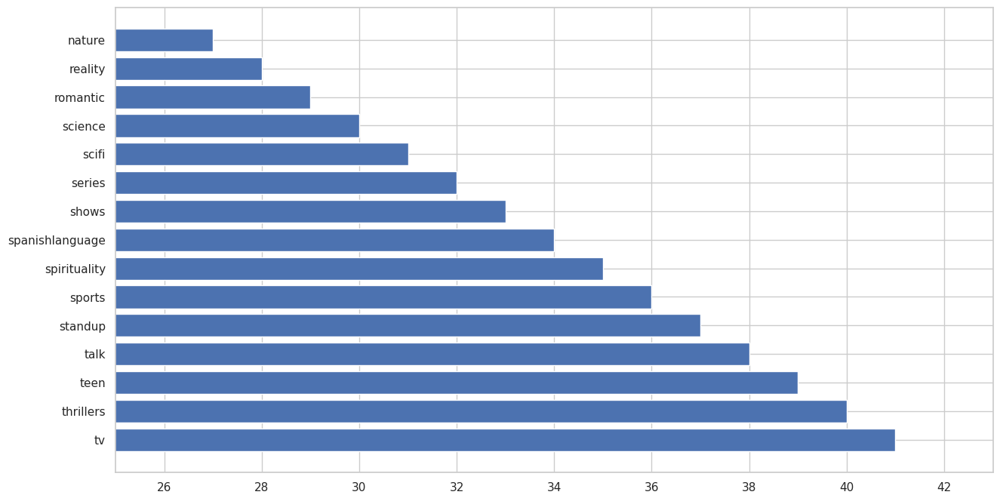

In [ ]:
plt.figure(figsize= (15,8))
plt.xlim(25,43)
plt.barh(top15_most_occured_words_listed_in,top15_most_occured_word_listed_in_count)

In [ ]:
# word cloud of top 15 words in listed_in

<function matplotlib.pyplot.show(close=None, block=None)>

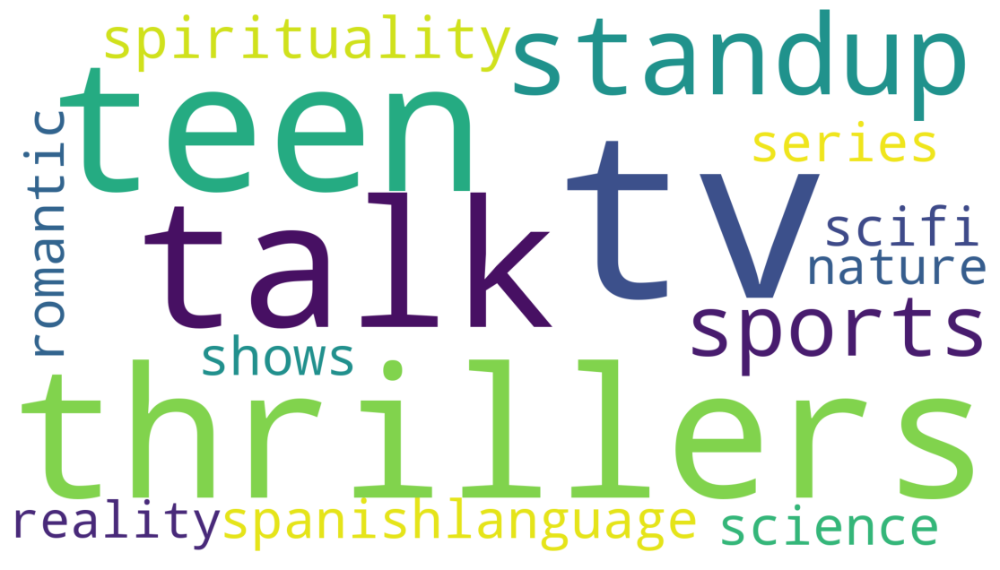

In [ ]:
plt.subplots(figsize= (16,8))
wordcloud= WordCloud(
                    background_color= 'white',
                    width= 1920,
                    height= 1080
                    ).generate(" ".join(top15_most_occured_words_listed_in))
# displaying the generated image
plt.imshow(wordcloud)
plt.axis('off')
plt.show

In [ ]:
df['listed_in']= df['listed_in'].apply(apply_stemming)
df.head(3).T

,0,1,2
show_id,s1,s2,s3
type,TV Show,Movie,Movie
title,3%,7:19,23:59
director,,Jorge Michel Grau,Gilbert Chan
cast,"João Miguel, Bianca Comparato, Michel Gomes, R...","Demián Bichir, Héctor Bonilla, Oscar Serrano, ...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."
country,Brazil,Mexico,Singapore
date_added,2020-08-14 00:00:00,2016-12-23 00:00:00,2018-12-20 00:00:00
release_year,2020,2016,2011
rating,Adults,Adults,Adults
duration,4 Seasons,93 min,78 min


In [ ]:
# creating object for Tf-idf Vectorizer
tfidf_vectorizer = TfidfVectorizer()
tfidf_vectorizer.fit(df['listed_in'])
dictionary = tfidf_vectorizer.vocabulary_.items()

In [ ]:
dictionary

dict_items([('intern', 18), ('tv', 39), ('show', 31), ('drama', 11), ('scifi', 29), ('fantasi', 14), ('movi', 22), ('horror', 16), ('action', 0), ('adventur', 1), ('independ', 17), ('mysteri', 24), ('thriller', 38), ('crime', 7), ('docuseri', 10), ('documentari', 9), ('sport', 34), ('comedi', 6), ('anim', 2), ('seri', 30), ('realiti', 26), ('romant', 27), ('scienc', 28), ('natur', 25), ('british', 3), ('korean', 20), ('music', 23), ('lgbtq', 21), ('faith', 12), ('spiritu', 33), ('kid', 19), ('spanishlanguag', 32), ('children', 4), ('famili', 13), ('classic', 5), ('cult', 8), ('standup', 35), ('talk', 36), ('teen', 37), ('featur', 15)])

In [ ]:
vocab= []
count_of_vocab= []
for key,value in dictionary:
    vocab.append(key)
    count_of_vocab.append(value)

In [ ]:
# store the count in pandas dataframe as index
vocab_after_stemming_listed_in= pd.DataFrame({'Words': vocab,
                                              'count': count_of_vocab})
# sort the dataframe by count
vocab_after_stemming_listed_in= vocab_after_stemming_listed_in.sort_values('count', ascending= False)

In [ ]:
# plot the graph of top vocabs in listed_in (after stemming )

In [ ]:
top15_most_occured_vocab_after_stemming= vocab_after_stemming_listed_in.head(15)

In [ ]:
top15_most_occured_vocab_after_stemming_word= top15_most_occured_vocab_after_stemming.Words.values
top15_most_occured_vocab_after_stemming_word

array(['tv', 'thriller', 'teen', 'talk', 'standup', 'sport', 'spiritu',
       'spanishlanguag', 'show', 'seri', 'scifi', 'scienc', 'romant',
       'realiti', 'natur'], dtype=object)

In [ ]:
# top15_most_occured_word_listed_in_count_after_stemming= top15_most_occured_vocab_after_stemming_word['count'].values
# top15_most_occured_word_listed_in_count_after_stemming

In [ ]:
# plt.figure(figsize= (15,8))
# plt.xlim(25,43)
# plt.barh(top15_most_occured_vocab_after_stemming_word,top15_most_occured_word_listed_in_count_after_stemming
# )

In [ ]:
df['length(listed_in)']= df['listed_in'].apply(lambda x: len(x))
df.head(3).T

,0,1,2
show_id,s1,s2,s3
type,TV Show,Movie,Movie
title,3%,7:19,23:59
director,,Jorge Michel Grau,Gilbert Chan
cast,"João Miguel, Bianca Comparato, Michel Gomes, R...","Demián Bichir, Héctor Bonilla, Oscar Serrano, ...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."
country,Brazil,Mexico,Singapore
date_added,2020-08-14 00:00:00,2016-12-23 00:00:00,2018-12-20 00:00:00
release_year,2020,2016,2011
rating,Adults,Adults,Adults
duration,4 Seasons,93 min,78 min


 #### applying clustering

*  clustering is the most important step in unsupervised problem. It deals with filling the collection of unlabelled data. A loose defination can be "the process of organizing objects into groups whose members
are similar in some way" A cluster is therefore is a collection of similar objects between them and dissimilar to the object belonging to the other cluster.

In [ ]:
# X= cluster

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

In [ ]:
X, y = make_blobs(n_samples=300, centers=4, cluster_std=0.6, random_state=0)


In [ ]:
k_values = range(1, 11)

In [ ]:
wcss = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

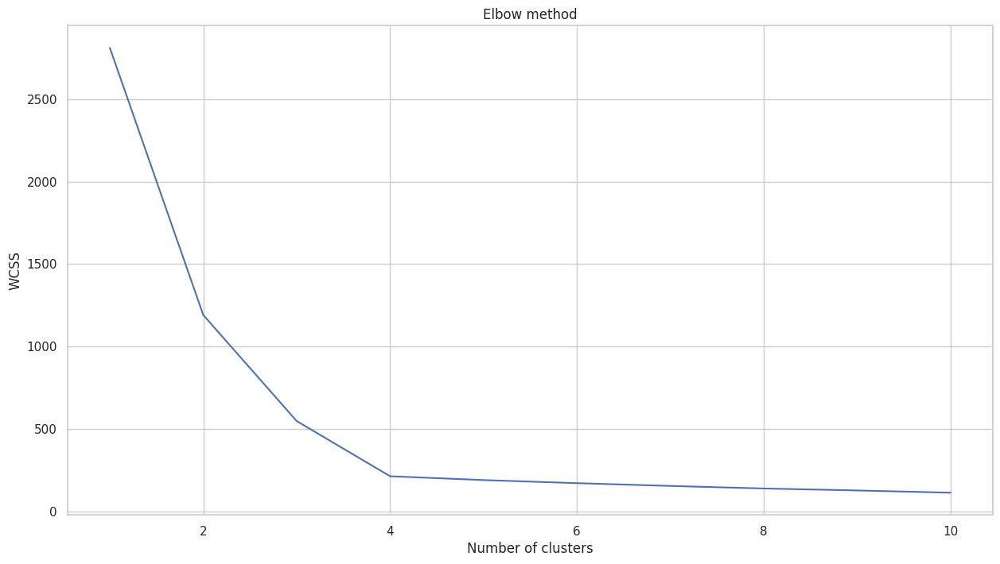

In [ ]:
plt.figure(figsize= (15,8))
plt.plot(k_values, wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.title('Elbow method')
plt.show()

In [ ]:
y_pred = kmeans.predict(X)

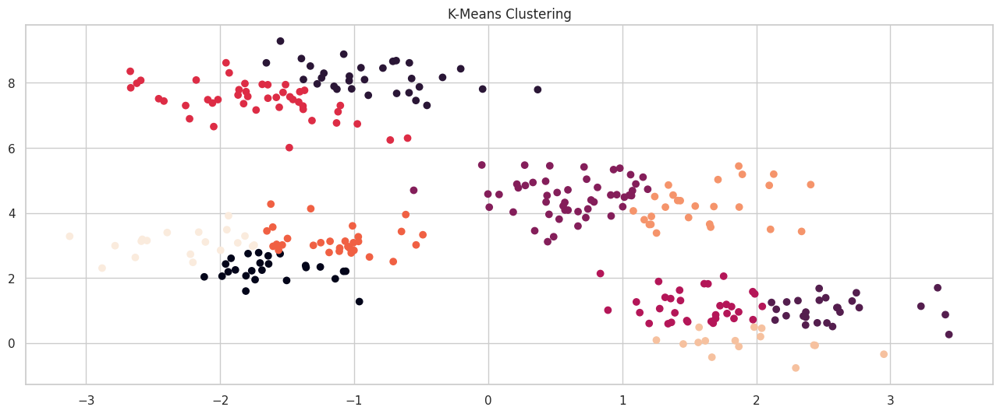

In [ ]:
plt.figure(figsize= (16,6))
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.title('K-Means Clustering')
plt.show()

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
X_transformed = pca.transform(X)

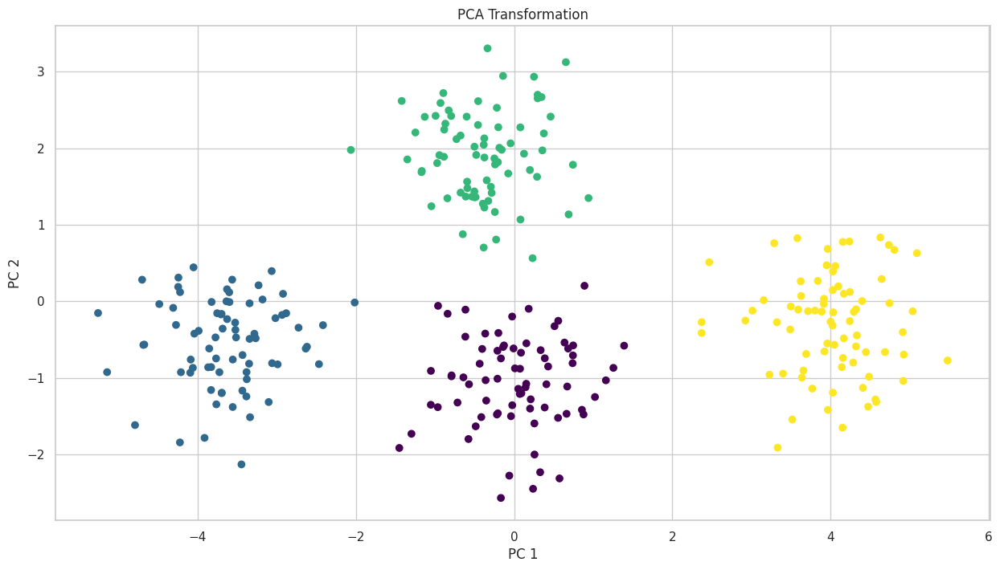

In [ ]:
plt.figure(figsize= (15,8))
plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y, cmap='viridis')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('PCA Transformation')
plt.show()

In [ ]:
# plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df.target)
# plt.xlabel('PCA 1')
# plt.ylabel('PCA 2')
# plt.title('PCA for netfix Dataset')
# plt.show()

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs

In [ ]:
X, y_true = make_blobs(n_samples=300, centers= 4,
                       cluster_std=0.60, random_state=0)

In [ ]:
dbscan = DBSCAN(eps=0.5, min_samples=5)

In [ ]:
dbscan.fit(X)
# Get the predicted cluster labels
y_pred = dbscan.labels_

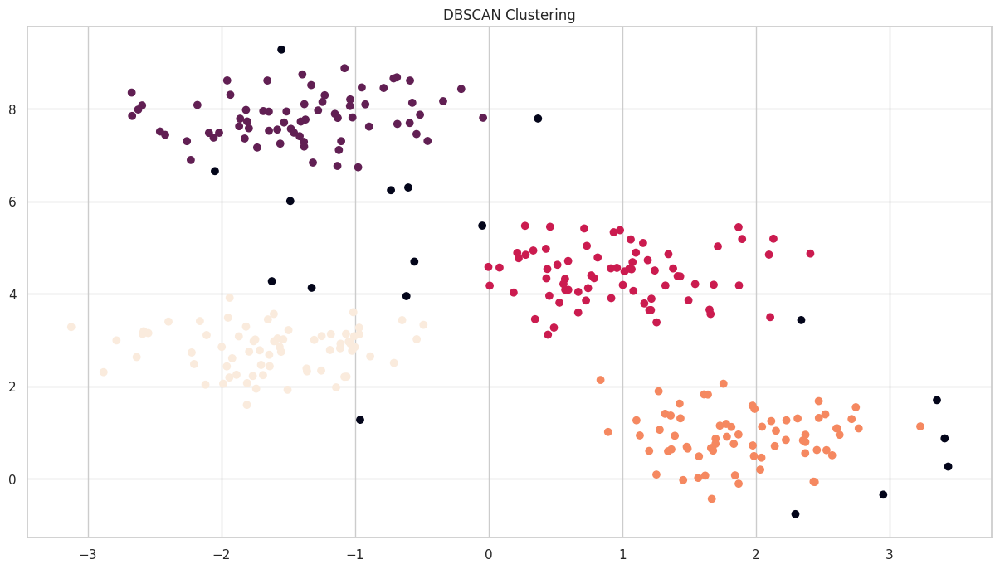

In [ ]:
plt.figure(figsize=(15,8))
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.title("DBSCAN Clustering")
plt.show()

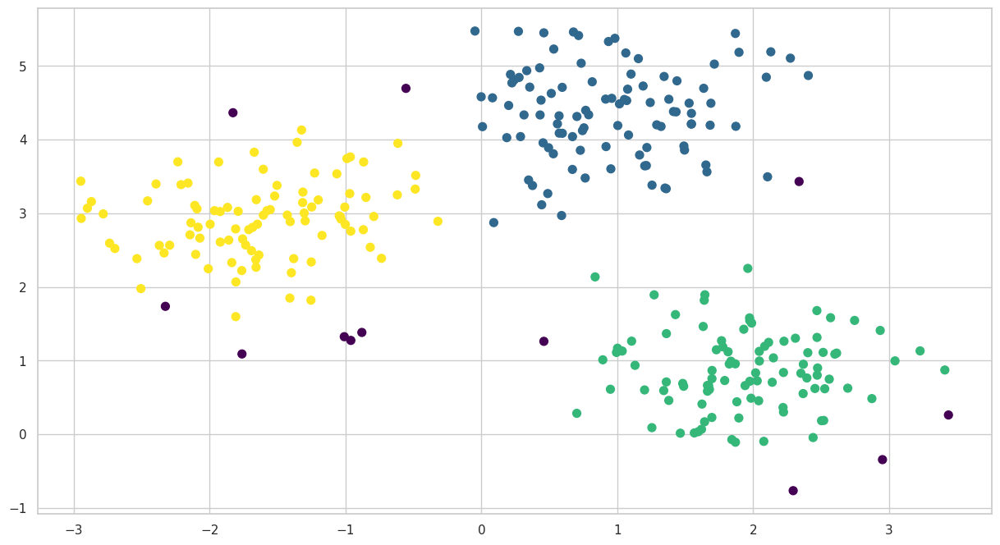

In [ ]:
plt.figure(figsize=(15,8))
y_dbscan = dbscan.fit_predict(X)

# create a scatter plot of the data points, colored by cluster
plt.scatter(X[:, 0], X[:, 1], c=y_dbscan, s=50, cmap='viridis')
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

In [ ]:
distances = pdist(X)

In [ ]:
Z = linkage(distances, method='complete')

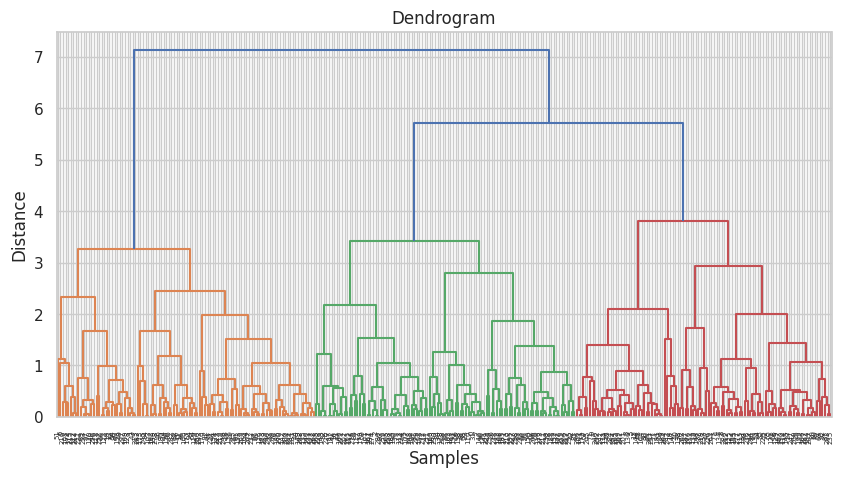

In [ ]:
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

In [ ]:
n_clusters = 4
model = AgglomerativeClustering(n_clusters=n_clusters, linkage='complete')
y = model.fit_predict(X)

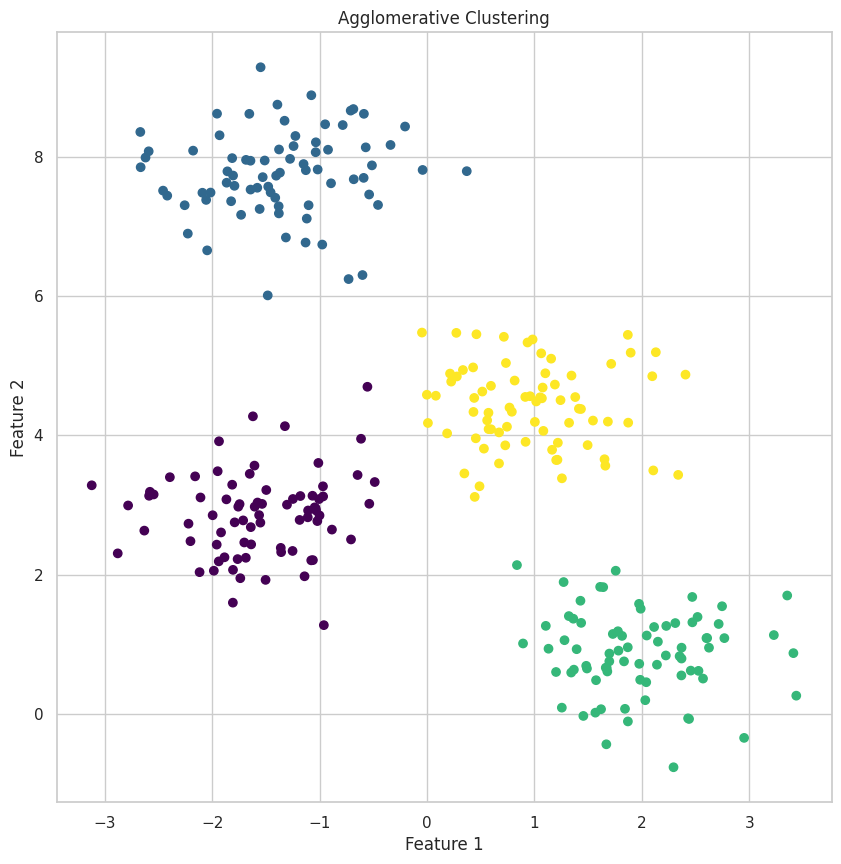

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
plt.title('Agglomerative Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

# Conclusion:-
*    We started by removing NaN values and converting the Netflix added date to year, month, and day using date time format.
*    Most films were released in the years 2018, 2019, and 2020.
*     The months of October, November, December and January had the largest number of films and television series released.
*   The number of watches are more on movies than tv shows
*   people are more interested towards international tv shows and series and movies
*   more rating are on adults and teen
*   Most of the releases are from USA. The United States, India, the United Kingdom, Canada, and Egypt are the top five producer countries.
*   Netflix has added a lot more movies and TV episodes in the previous years, but the numbers are still low when compared to movies released in the last ten years.
*   The final model of k-means clustering has 4 number of cluster are the best fit. We proved this using elbow method.
*   By using various algorithms like k-means, hierarchial, DBSCAN, PCA, agglomerative clustering we found the prominent number of clusters are four.